<a href="https://colab.research.google.com/github/chemaoxfz/thesis/blob/main/202205_Thesis_binding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
# Plotting modules and settings.
import matplotlib.pyplot as plt
import seaborn as sns
colors = ('#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
          '#9467bd', '#8c564b', '#e377c2', '#7f7f7f',
          '#bcbd22', '#17becf')
sns.set(style='ticks', palette=colors)

sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

# The following is specific Jupyter notebooks
%matplotlib inline
%config InlineBackend.figure_formats = {'png', 'retina'}


Let's see whether the linear derivatives also sample nicely to form some polyhedral shape.

## The function that computes the log derivative in general.
### You could specify \\(L\\) and \\(N\\) matrices directly, or use l_from_n function to compute \\(L\\) from \\(N\\).

In [ ]:
def log_der_calc(x,l_mat,n_mat):
  #given x, L and N, return the log derivative
  t_inv = 1/(l_mat.dot(x))
  temp=l_mat*x
  upper=(temp.T*t_inv).T
  logder_inv=np.concatenate((upper,n_mat),axis=0)
  return np.linalg.inv(logder_inv)

def l_from_n(n_mat):
  #given N matrix, return L matrix. 
  #Assume species ordered so that the atomic species come first.
  r=n_mat.shape[0]
  d=n_mat.shape[1]-r
  n1_mat=n_mat[:,:d]
  n2_mat=n_mat[:,-r:]
  l2_mat=-(n1_mat.T).dot(np.linalg.inv(n2_mat).T)
  l_mat=np.concatenate((np.eye(d),l2_mat),axis=1)
  return l_mat

def log_der_calc_atomic(xa,k,l_mat,n_mat):
  #given xa,k (atomic concentrations and binding constants),
  # and L and N, return the log derivative
  d,n=l_mat.shape
  temp1=(l_mat.T).dot(np.log(xa))
  n2_mat=n_mat[:,d:]
  temp2=np.linalg.inv(n2_mat).dot(np.log(k))
  x=np.exp(temp1 + np.pad(temp2,(d,0),mode='constant',constant_values=(0,0)))
  return x,log_der_calc(x,l_mat,n_mat)


## Sampling the reaction orders of \\(C\\) in \\(t_E\\) and \\(t_S\\) in the simple binding reaction \\(E+S \rightleftharpoons C\\).

Order of the species is \\((E,S,C)\\), order of the totals is \\((t_E,t_S)\\).

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

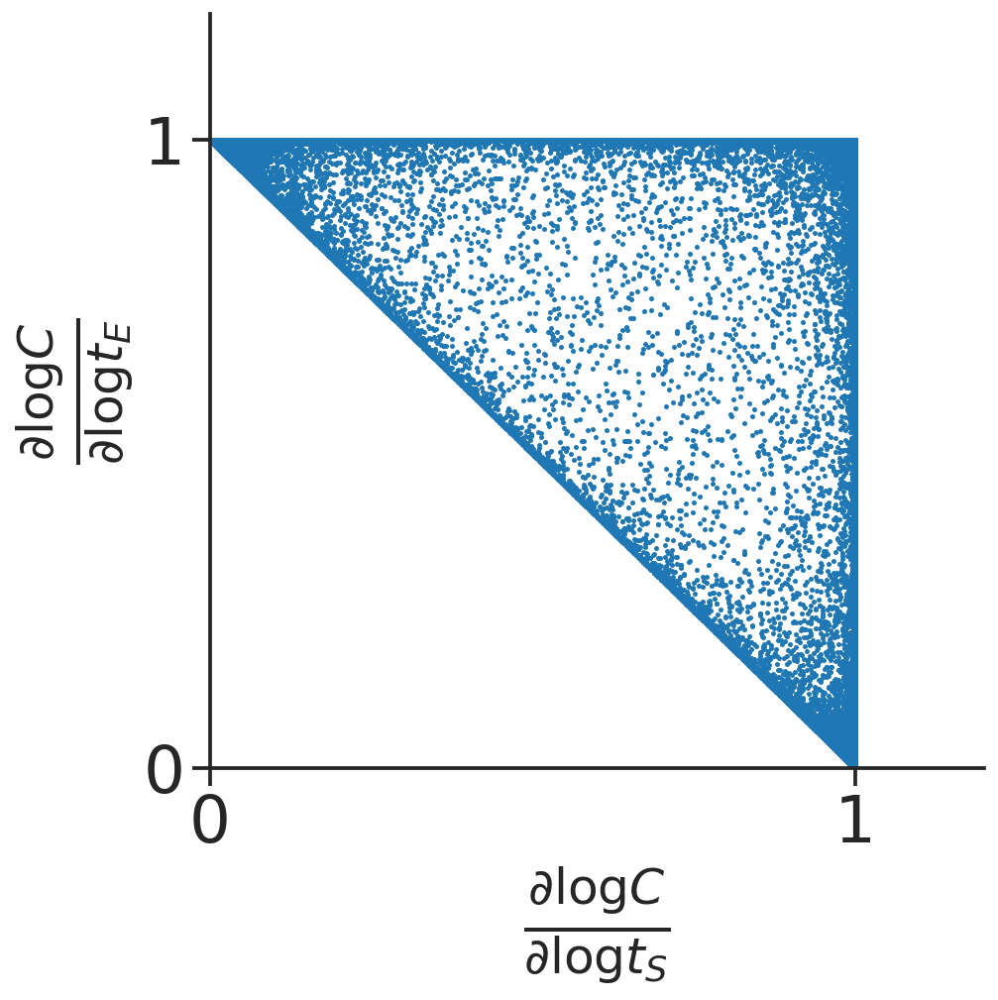

In [ ]:
l_mat=np.array([[1,0,1],
                [0,1,1]])
n_mat=np.array([[-1,-1,1]])
d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim]) # 2nd index is species, 3rd index is total and k.

for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.scatter(logders[:,2,1],logders[:,2,0],s=1)
ax.set_xlabel(r'$\frac{\partial \log C}{\partial \log t_S}$')
ax.set_ylabel(r'$\frac{\partial \log C}{\partial \log t_E}$')

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=2)
plt.locator_params(axis='y', nbins=2)

ax.set_xlim([0,1.2])
ax.set_ylim([0,1.2])
handles, labels = ax.get_legend_handles_labels()

## Below are commands that saves and then downloads the figure from google colab
plt.savefig('C-log-der-tE-tS-sampling-transparent.png', dpi=200,bbox_inches='tight',transparent=True)
from google.colab import files
files.download('C-log-der-tE-tS-sampling-transparent.png') 

Without re-simulating, we can take the points simulated from above and plot the reaction order of \\(E\\) in \\(t_E, t_S\\).

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

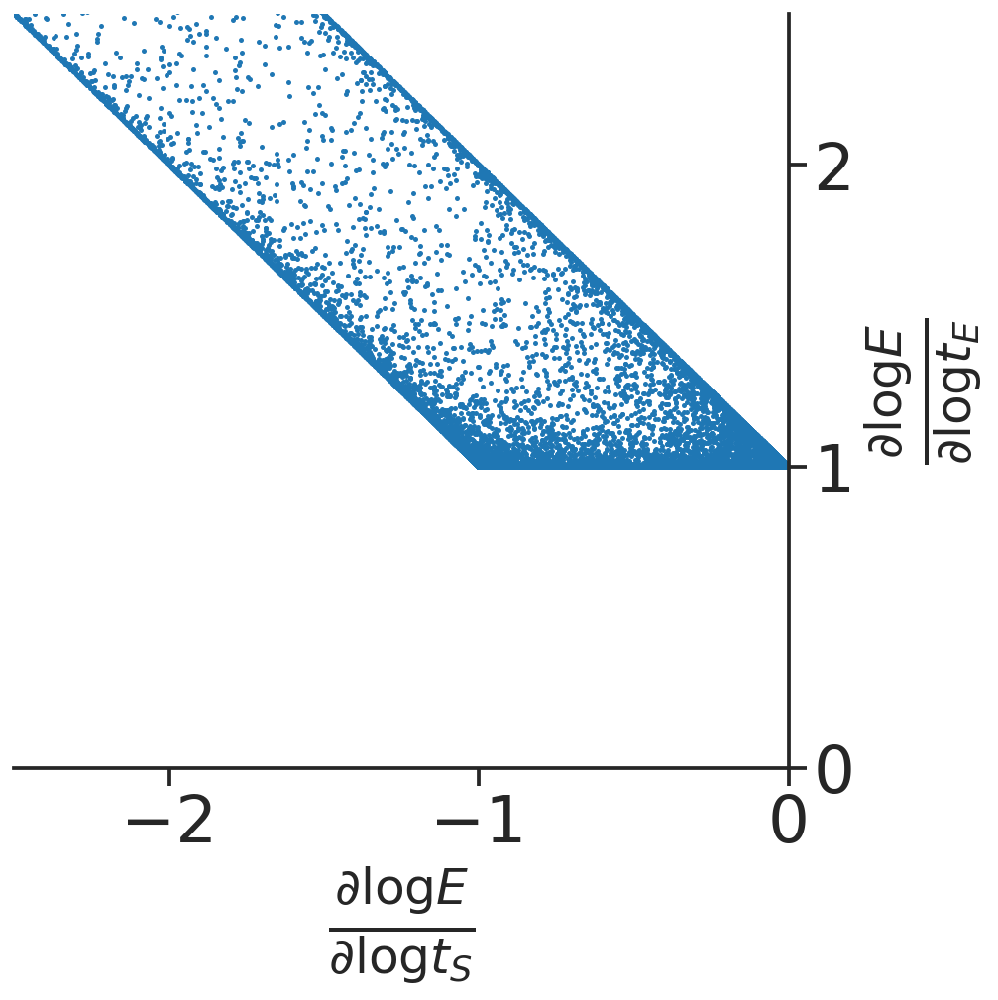

In [ ]:
fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.scatter(logders[:,0,1],logders[:,0,0],s=1)
ax.set_xlabel(r'$\frac{\partial \log E}{\partial \log t_S}$')
ax.set_ylabel(r'$\frac{\partial \log E}{\partial \log t_E}$')


#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_position('zero')
ax.spines['bottom'].set_position('zero')
ax.yaxis.set_ticks_position('right')
ax.yaxis.set_label_position('right') 
ax.set_xlim([-2.5,0])
ax.set_ylim([0,2.5])
plt.locator_params(axis='x', nbins=3)
plt.locator_params(axis='y', nbins=3)

handles, labels = ax.get_legend_handles_labels()
## Below are commands that saves and then downloads the figure from google colab
plt.savefig('E-log-der-tE-tS-sampling.pdf', bbox_inches='tight')
from google.colab import files
files.download('E-log-der-tE-tS-sampling.pdf') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

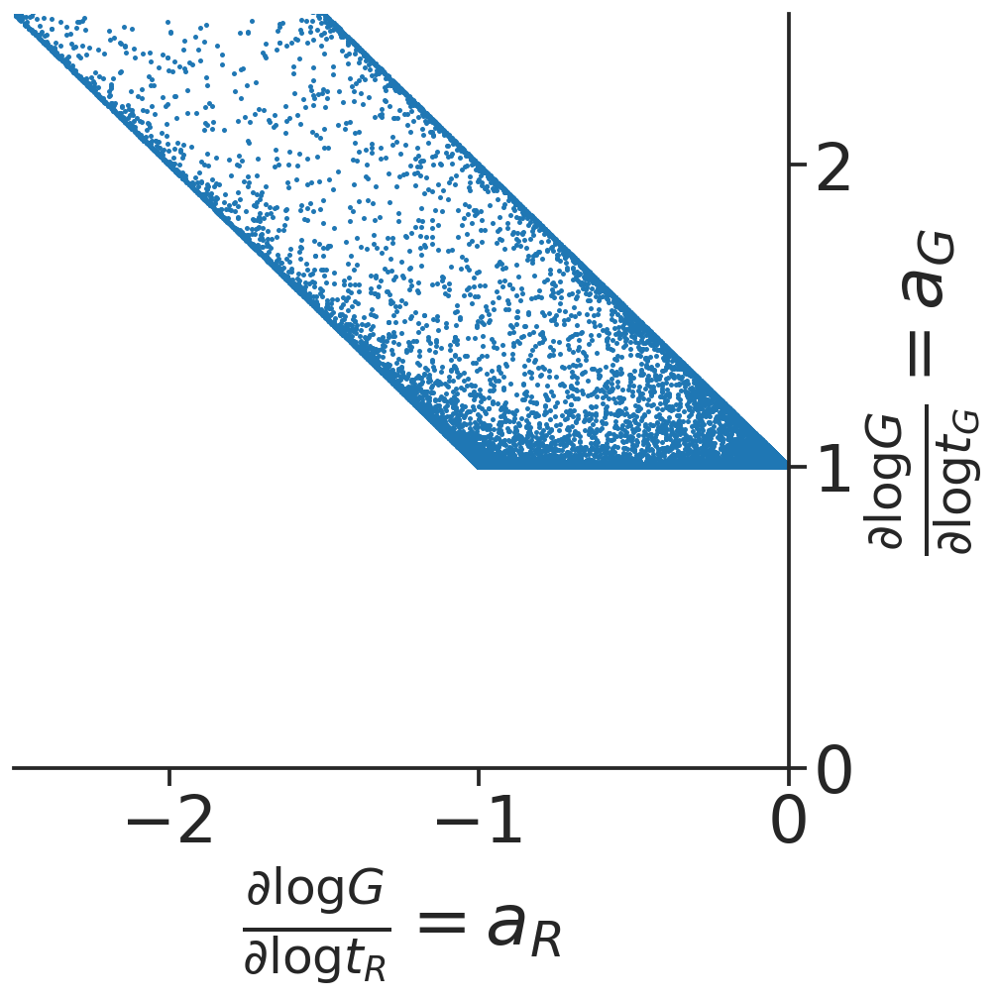

In [ ]:
fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.scatter(logders[:,0,1],logders[:,0,0],s=1)
ax.set_xlabel(r'$\frac{\partial \log G}{\partial \log t_R} = a_R$')
ax.set_ylabel(r'$\frac{\partial \log G}{\partial \log t_G}  = a_G$')


#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_position('zero')
ax.spines['bottom'].set_position('zero')
ax.yaxis.set_ticks_position('right')
ax.yaxis.set_label_position('right') 
ax.set_xlim([-2.5,0])
ax.set_ylim([0,2.5])
plt.locator_params(axis='x', nbins=3)
plt.locator_params(axis='y', nbins=3)

handles, labels = ax.get_legend_handles_labels()
## Below are commands that saves and then downloads the figure from google colab
plt.savefig('G-log-der-tG-tR-sampling.png', dpi=200, bbox_inches='tight')
from google.colab import files
files.download('G-log-der-tG-tR-sampling.png') 

### Both \\(E\\) and \\(C\\) in one figure

In [ ]:
l_mat=np.array([[1,0,1],
                [0,1,1]])
n_mat=np.array([[-1,-1,1]])
d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim]) # 2nd index is species, 3rd index is total and k.

for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

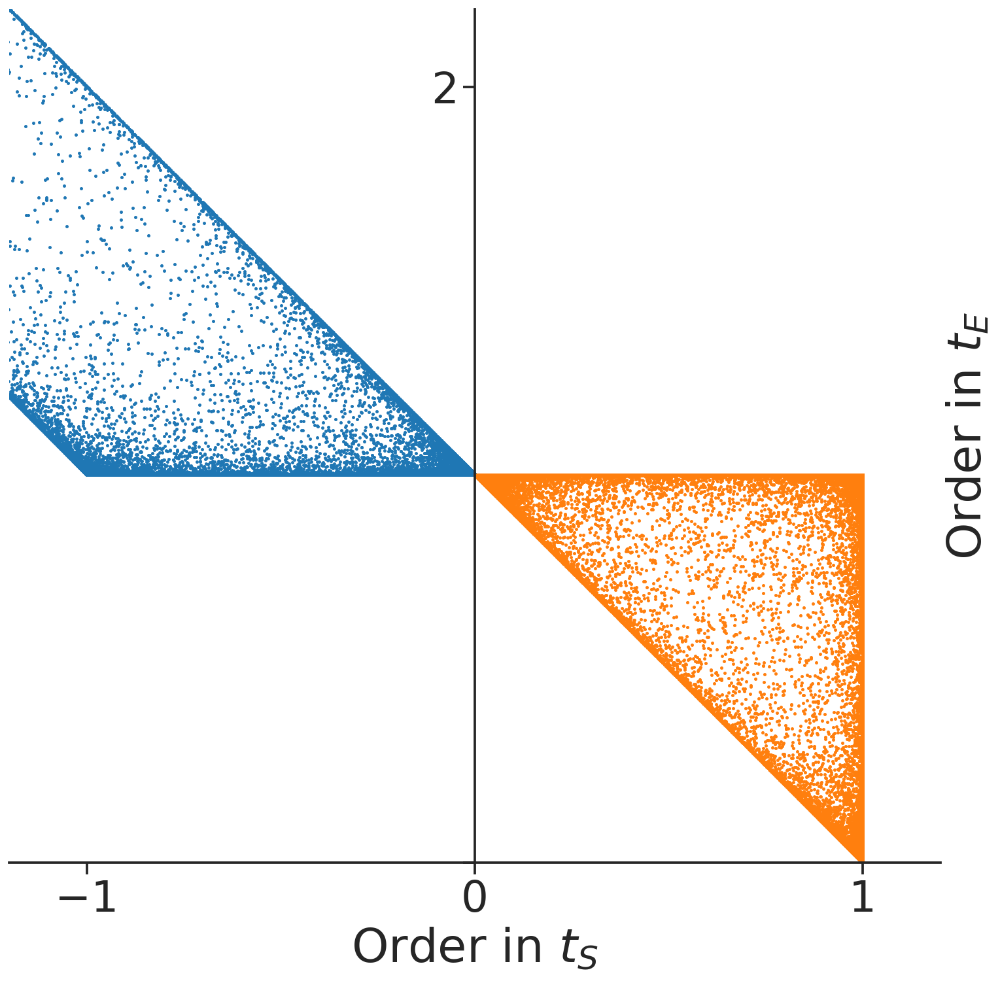

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(14,12))
ax.set_aspect('equal')
ax.scatter(logders[:,0,1],logders[:,0,0],s=1)
ax.scatter(logders[:,2,1],logders[:,2,0],s=1)
ax.set_xlabel(r'Order in $t_S$')
ax.set_ylabel(r'Order in $t_E$')

#remove top and right borders
ax.spines['left'].set_position('zero')
ax.spines['right'].set_visible(False)
# ax.spines['right'].set_position(1)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=2)
plt.locator_params(axis='y', nbins=2)

ax.set_xlim([-1.2,1.2])
ax.set_ylim([0,2.2])
handles, labels = ax.get_legend_handles_labels()


#remove top and right borders
# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['left'].set_position('zero')
# ax.spines['bottom'].set_position('zero')
# ax.yaxis.set_ticks_position('right')
ax.yaxis.set_label_position('right') 
ax.yaxis.set_ticklabels(['',2])
# ax.set_xlim([-2.5,0])
# ax.set_ylim([0,2.5])
# plt.locator_params(axis='x', nbins=3)
# plt.locator_params(axis='y', nbins=3)

## Below are commands that saves and then downloads the figure from google colab
plt.savefig('ESC-log-der-tE-tS.png', dpi=300, bbox_inches='tight')


In [ ]:
from google.colab import files
files.download('ESC-log-der-tE-tS.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Example of sampling the ESC polyhedron using atomic species.

In [ ]:
l_mat=np.array([[1,0,1],
                [0,1,1]])
n_mat=np.array([[-1,-1,1]])
d_dim,n_dim=l_mat.shape
r_dim=n_dim-d_dim

n_pts=10000
xa_min_log10=-6
xa_max_log10=6
k_min_log10=-0
k_max_log10=0
xa=10**(np.random.rand(n_pts,d_dim)*(xa_max_log10 - xa_min_log10)+xa_min_log10)
k = 10**(np.random.rand(n_pts,r_dim)*(k_max_log10 - k_min_log10)+k_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
xx=np.zeros([n_pts,n_dim])
for i in range(n_pts):
  xx[i],logders[i]=log_der_calc_atomic(xa[i],k[i],l_mat,n_mat)

## Enzymatic reaction with product binding.
Consider an enzymatic reaction \\(E+S \rightleftharpoons C_{ES} \rightarrow C_{EP} \rightleftharpoons E+P \\) with product binding taken into account.

The binding network involved is \\(E+S \rightleftharpoons C_{ES}\\), \\(E+P \rightleftharpoons C_{EP}\\).

The catalysis reaction is \\(t_S \rightarrow t_P\\), with rate proportional to \\(C_{ES}\\).

Order species by \\((E,S,P,C_{ES},C_{EP})\\). 

Stoichiometry matrix is
\\(N = \begin{bmatrix} -1 & -1 & 0 & 1 & 0 \\ -1 & 0 & -1 & 0 & 1 \end{bmatrix}\\).

Order totals by \\((t_E,t_S,t_P)\\).

Conservation law matrix is
\\(L = \begin{bmatrix} 1 & 0 & 0 & 1 & 1 \\ 0 & 1 & 0 & 1 & 0 \\ 0 & 0 & 1 & 0 & 1 \end{bmatrix}\\).

In [ ]:
n_mat=np.array([[-1,-1,0,1,0],
                [-1,0,-1,0,1]])
l_mat=l_from_n(n_mat)
print(l_mat)

[[ 1.  0.  0.  1.  1.]
 [ 0.  1.  0.  1. -0.]
 [ 0.  0.  1. -0.  1.]]


In [ ]:
d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

2D plots to look at the range of the reaction orders.

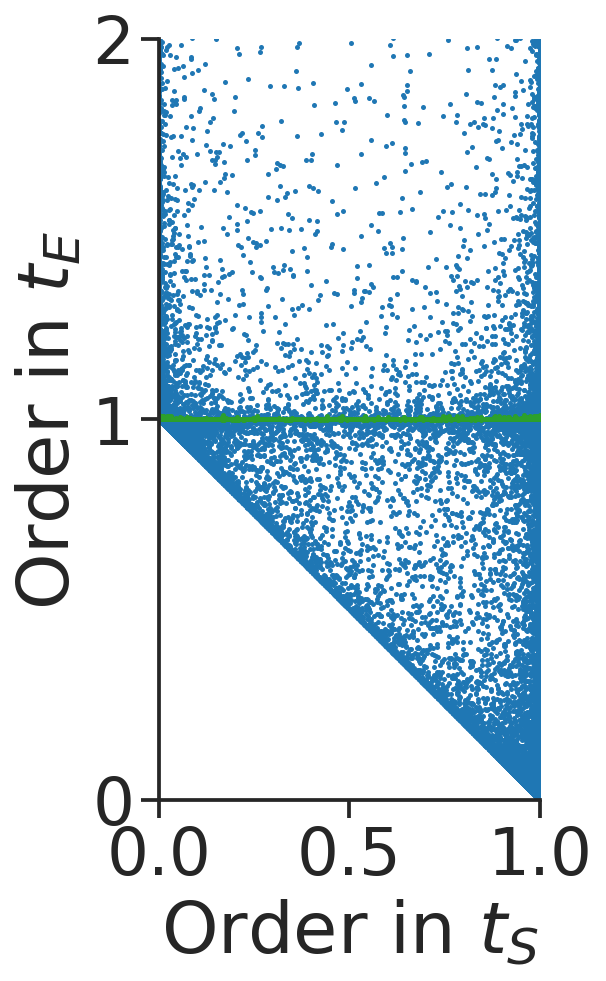

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})


c_idx=3 #index for the active complex to be plotted.
c_label='C_{ES}'

x_idx=1
x_label='t_S'
y_idx=0
y_label='t_E'
# y_idx=2
# y_label='t_P'

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,c_idx,x_idx],logders[:,c_idx,y_idx],s=1)

ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+y_label+'$')

#remove top and right borders
# ax.spines['left'].set_position('zero')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=2)
plt.locator_params(axis='y', nbins=2)

ax.set_xlim([0,1])
ax.set_ylim([0,2])
handles, labels = ax.get_legend_handles_labels()


#remove top and right borders
# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.spines['left'].set_position('zero')
# ax.spines['bottom'].set_position('zero')
# ax.yaxis.set_ticks_position('right')
# ax.yaxis.set_label_position('right') 
# ax.yaxis.set_ticklabels(['',2])
# ax.set_xlim([-2.5,0])
# ax.set_ylim([0,2.5])
# plt.locator_params(axis='x', nbins=3)
# plt.locator_params(axis='y', nbins=3)





In [ ]:
te=xx[:,0]+xx[:,3]+xx[:,4]
ts=xx[:,1]+xx[:,3]
mask_P=np.where(xx[:,4]/te <.01)
mask_tste=np.where(te/ts < .01)
mask_MM=np.where((xx[:,4]/te <.01) * (te/ts < .01))
ax.scatter(logders[mask_MM,c_idx,x_idx],logders[mask_MM,c_idx,y_idx],s=1,color=colors[2])

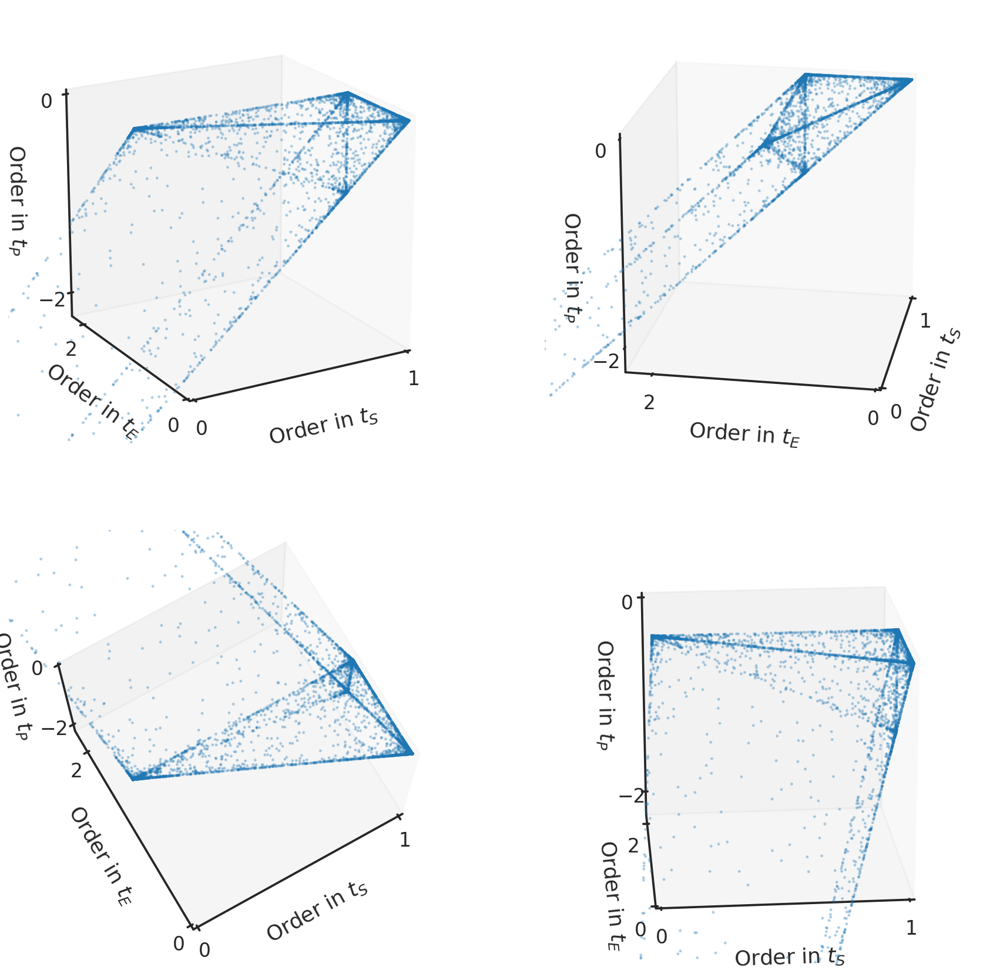

In [ ]:

sns.set_context('talk',font_scale=1,rc={'lines.linewidth':3})

fig = plt.figure(figsize=(15,15))

c_idx=3 #index for the active complex to be plotted.

xmin=0; xmax=1; 
ymin=0; ymax=2.2; 
zmin=-2.2; zmax=0; 


c_label='C_{ES}'

x_label='t_S'
y_label='t_E'
z_label='t_P'
xs=logders[:,c_idx,1]
ys=logders[:,c_idx,0]
zs=logders[:,c_idx,2]

views=[(20,-120),(20,-170),(75,-120),(20,-95)]

nn=10000

for i in range(4):
  ax = fig.add_subplot(2, 2, i+1, projection='3d')
  ax.scatter(xs[:nn],ys[:nn],zs[:nn],s=1,alpha=0.3)
  ax.set_xlabel(r'Order in $'+x_label+'$')
  ax.set_ylabel(r'Order in $'+y_label+'$')
  ax.set_zlabel(r'Order in $'+z_label+'$')
  ax.set_xlim([xmin,xmax])
  ax.set_ylim([ymin,ymax])
  ax.set_zlim([zmin,zmax])

  #remove top and right borders
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  #restrict number of ticks

  plt.locator_params(axis='x', nbins=1)
  plt.locator_params(axis='y', nbins=1)
  plt.locator_params(axis='z', nbins=1)

  ax.xaxis.labelpad = 10
  ax.yaxis.labelpad = 10
  ax.zaxis.labelpad = 10

  ax.spines['left'].set_position('zero')

  view=views[i]
  ax.view_init(view[0],view[1])

  ax.grid(False)
# plt.savefig('enzym-with-product-binding-sampling.png', dpi=300, bbox_inches='tight')

3D plot with 2D projections. Maybe this has better visualization in this case.

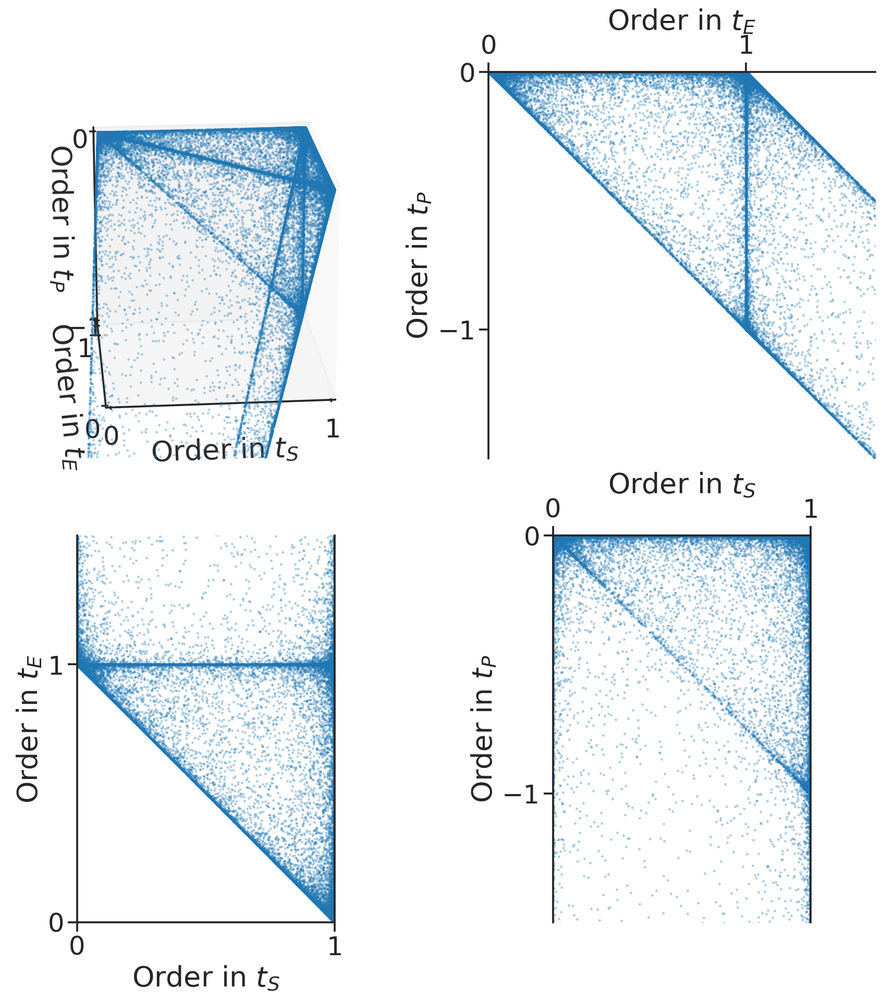

In [ ]:

sns.set_context('talk',font_scale=1.5,rc={'lines.linewidth':3})

fig = plt.figure(figsize=(15,15))

c_idx=3 #index for the active complex to be plotted.

xmin=0; xmax=1; 
ymin=0; ymax=1; 
zmin=-1; zmax=0; 


c_label='C_{ES}'

x_label='t_S'
y_label='t_E'
z_label='t_P'

# FRIST, plot a 3d view

ax = fig.add_subplot(2, 2, 1, projection='3d')
ax.grid(False)
xs=logders[:,c_idx,1]
ys=logders[:,c_idx,0]
zs=logders[:,c_idx,2]
ax.scatter(xs,ys,zs,s=1,alpha=0.3)
# ax.set_box_aspect(((xmax-xmin),(ymax-ymin),(zmax-zmin)))  # aspect ratio is 1:1:1 in data space


# ax.set_xlabel(r'$\frac{\partial \log'+ c_label+'}{\partial \log'+x_label+'}$')
# ax.set_ylabel(r'$\frac{\partial \log'+ c_label+'}{\partial \log'+y_label+'}$')
# ax.set_zlabel(r'$\frac{\partial \log'+ c_label+'}{\partial \log'+z_label+'}$')
ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+y_label+'$')
ax.set_zlabel(r'Order in $'+z_label+'$')
ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax])
ax.set_zlim([zmin,zmax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin))
plt.locator_params(axis='y', nbins=int(ymax-ymin))
plt.locator_params(axis='z', nbins=int(zmax-zmin))

ax.xaxis.labelpad = 10
ax.yaxis.labelpad = 10
ax.zaxis.labelpad = 10

ax.view_init(20,-95)




xmin=0; xmax=1; 
ymin=0; ymax=1.5; 
zmin=-1.5; zmax=0; 
## SECOND, plot projection along the first (x) axis.
## so x-axis is 2nd axis, y-axis is 3rd axis.
ax = fig.add_subplot(2, 2, 2)
ax.set_aspect('equal')
ax.scatter(ys,zs,s=1,alpha=0.3)
ax.set_xlabel(r'Order in $'+y_label+'$')
ax.set_ylabel(r'Order in $'+z_label+'$')
ax.set_xlim([ymin,ymax])
ax.set_ylim([zmin,zmax])

ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top') 
plt.locator_params(axis='x', nbins=int(ymax-ymin))
plt.locator_params(axis='y', nbins=int(zmax-zmin))

## THIRD, plot projection along the 3rd (z) axis.
## so x-axis is 2nd axis (y), y-axis is 1st axis (x).
ax = fig.add_subplot(2, 2, 3)
ax.set_aspect('equal')
ax.scatter(xs,ys,s=1,alpha=0.3)
ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+y_label+'$')
ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax])

ax.spines['top'].set_visible(False)
plt.locator_params(axis='x', nbins=int(ymax-ymin))
plt.locator_params(axis='y', nbins=int(xmax-xmin))

## FOURTH, plot projection along the 2rd (y) axis.
## so x-axis is 1st axis (x), y-axis is 3nd axis (z).
ax = fig.add_subplot(2, 2, 4)
ax.set_aspect('equal')
ax.scatter(xs,zs,s=1,alpha=0.3)
ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+z_label+'$')
ax.set_xlim([xmin,xmax])
ax.set_ylim([zmin,zmax])

ax.spines['bottom'].set_visible(False)
# ax.spines['right'].set_visible(False)
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top') 
plt.locator_params(axis='x', nbins=int(xmax-xmin))
plt.locator_params(axis='y', nbins=int(zmax-zmin))

plt.savefig('enzyme-with-product-binding.png', dpi=200, bbox_inches='tight')

In [ ]:
from google.colab import files
files.download('enzyme-with-product-binding.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

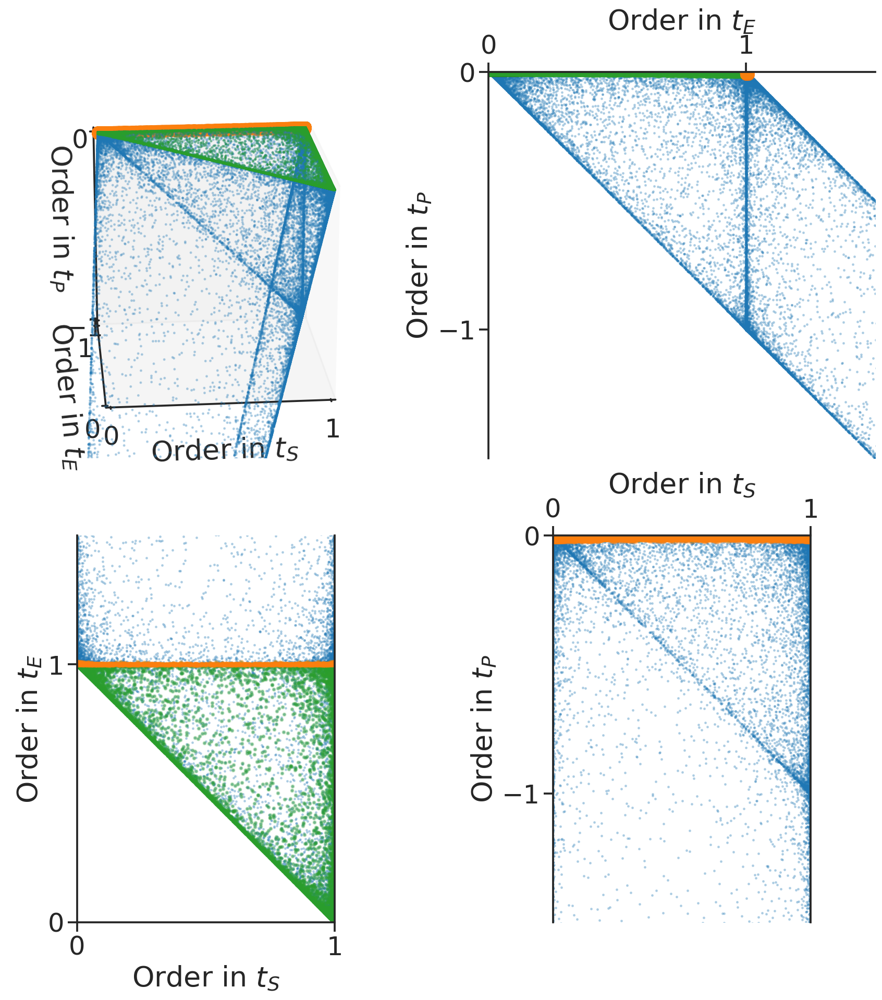

In [ ]:
te=xx[:,0]+xx[:,3]+xx[:,4]
ts=xx[:,1]+xx[:,3]
mask_P=np.where(xx[:,4]/te <.01)
mask_tste=np.where(te/ts < .01)
mask_MM=np.where((xx[:,4]/te <.01) * (te/ts < .01))


sns.set_context('talk',font_scale=1.5,rc={'lines.linewidth':3})

fig = plt.figure(figsize=(15,15))

c_idx=3 #index for the active complex to be plotted.

xmin=0; xmax=1; 
ymin=0; ymax=1; 
zmin=-1; zmax=0; 


c_label='C_{ES}'

x_label='t_S'
y_label='t_E'
z_label='t_P'

# FRIST, plot a 3d view

ax = fig.add_subplot(2, 2, 1, projection='3d')
ax.grid(False)
xs=logders[:,c_idx,1]
ys=logders[:,c_idx,0]
zs=logders[:,c_idx,2]
ax.scatter(xs,ys,zs,s=1,alpha=0.3)

ax.scatter(xs[mask_P],ys[mask_P],zs[mask_P],s=1,color=colors[2],alpha=0.3)
ax.scatter(xs[mask_MM],ys[mask_MM],zs[mask_MM],s=100,color=colors[1],alpha=0.3)


# ax.set_xlabel(r'$\frac{\partial \log'+ c_label+'}{\partial \log'+x_label+'}$')
# ax.set_ylabel(r'$\frac{\partial \log'+ c_label+'}{\partial \log'+y_label+'}$')
# ax.set_zlabel(r'$\frac{\partial \log'+ c_label+'}{\partial \log'+z_label+'}$')
ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+y_label+'$')
ax.set_zlabel(r'Order in $'+z_label+'$')
ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax])
ax.set_zlim([zmin,zmax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin))
plt.locator_params(axis='y', nbins=int(ymax-ymin))
plt.locator_params(axis='z', nbins=int(zmax-zmin))

ax.xaxis.labelpad = 10
ax.yaxis.labelpad = 10
ax.zaxis.labelpad = 10

ax.view_init(20,-95)




xmin=0; xmax=1; 
ymin=0; ymax=1.5; 
zmin=-1.5; zmax=0; 
## SECOND, plot projection along the first (x) axis.
## so x-axis is 2nd axis, y-axis is 3rd axis.
ax = fig.add_subplot(2, 2, 2)
ax.set_aspect('equal')
ax.scatter(ys,zs,s=1,alpha=0.3)


ax.scatter(ys[mask_P],zs[mask_P],s=50,color=colors[2],alpha=0.3)
ax.scatter(ys[mask_MM],zs[mask_MM],s=100,color=colors[1],alpha=0.1)

ax.set_xlabel(r'Order in $'+y_label+'$')
ax.set_ylabel(r'Order in $'+z_label+'$')
ax.set_xlim([ymin,ymax])
ax.set_ylim([zmin,zmax])

ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top') 
plt.locator_params(axis='x', nbins=int(ymax-ymin))
plt.locator_params(axis='y', nbins=int(zmax-zmin))

## THIRD, plot projection along the 3rd (z) axis.
## so x-axis is 2nd axis (y), y-axis is 1st axis (x).
ax = fig.add_subplot(2, 2, 3)
ax.set_aspect('equal')
ax.scatter(xs,ys,s=1,alpha=0.3)


ax.scatter(xs[mask_P],ys[mask_P],s=6,color=colors[2],alpha=0.3)
ax.scatter(xs[mask_MM],ys[mask_MM],s=12,color=colors[1],alpha=0.3)

ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+y_label+'$')
ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax])

ax.spines['top'].set_visible(False)
plt.locator_params(axis='x', nbins=int(ymax-ymin))
plt.locator_params(axis='y', nbins=int(xmax-xmin))

## FOURTH, plot projection along the 2rd (y) axis.
## so x-axis is 1st axis (x), y-axis is 3nd axis (z).
ax = fig.add_subplot(2, 2, 4)
ax.set_aspect('equal')
ax.scatter(xs,zs,s=1,alpha=0.3)

ax.scatter(xs[mask_P],zs[mask_P],s=50,color=colors[2],alpha=0.3)
ax.scatter(xs[mask_MM],zs[mask_MM],s=100,color=colors[1],alpha=0.3)


ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+z_label+'$')
ax.set_xlim([xmin,xmax])
ax.set_ylim([zmin,zmax])

ax.spines['bottom'].set_visible(False)
# ax.spines['right'].set_visible(False)
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top') 
plt.locator_params(axis='x', nbins=int(xmax-xmin))
plt.locator_params(axis='y', nbins=int(zmax-zmin))

plt.savefig('enzyme-with-product-binding-MM-P.png', dpi=200, bbox_inches='tight')

In [ ]:
from google.colab import files
files.download('enzyme-with-product-binding-MM-P.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Numerical simulation of the catalysis process 
\\( \frac{d}{dt} t_P = k^{\mathrm{cat}} C_{ES}(t_E,t_S,t_P) \\).

As the fraction products in total substrate and product \\(\frac{t_P}{t_S+t_P}\\) increases from 0 to 1, how is the rate \\(C_{ES}\\) affected.

In [ ]:
from scipy.optimize import fsolve
from scipy.integrate import solve_ivp

def func(x,params): #x is 5-dim, e,s,p,ces,cep
  kes=params['kes']
  kep=params['kep']
  te=params['te']
  ts=params['ts']
  tp=params['tp']
  return [x[0]*x[1]-kes*x[3],
          x[0]*x[2]-kep*x[4],
          x[0]+x[3]+x[4]-te,
          x[1]+x[3]-ts,
          x[2]+x[4]-tp]


def df(t,y,params): #y it totals, t_P
  kcat=params['kcat']
  t_metabolite=params['t_metabolite']
  params_solve={
      'kes':params['kes'],
      'kep':params['kep'],
      'te':params['te'],
      'tp':y,
      'ts':t_metabolite-y
  }
  func_temp=lambda x:func(x,params_solve)
  root = fsolve(func_temp, [1, 1,1,1,1])
  ces=root[3]
  return [kcat*ces]


params={
    'kcat':1,
    't_metabolite':10,
    'kes':1,
    'kep':1e1,
    'te':1
}

t_init=0
t_end=100
npts=5000
t_span=(t_init,t_end)
t_eval=np.linspace(t_init,t_end,npts)
y0=[0]

func_int=lambda t,y:df(t,y,params)
sol=solve_ivp(func_int,t_span,y0,t_eval=t_eval)

/usr/local/lib/python3.7/dist-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


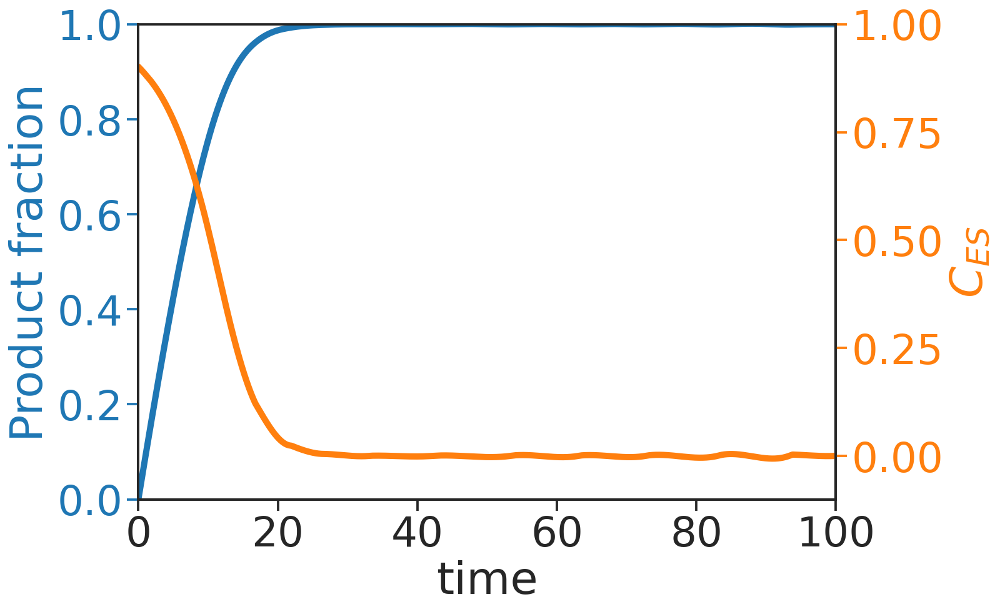

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(10,7))

ax.plot(sol.t,sol.y[0]/params['t_metabolite'],color=colors[0],lw=5)
ax.set_xlabel(r'time')
ax.set_ylabel(r'Product fraction')
ax.set_ylim([0,1])
ax.set_xlim([t_init,t_end])

ax2=ax.twinx()
dt=(t_end-t_init)/npts
ces=np.diff(sol.y[0])/dt/params['kcat']
ax2.plot(sol.t[1:],ces,color=colors[1],lw=5)
ax2.set_ylim([-0.1,1])
# ax.set_yscale('log')
ax2.set_ylabel(r'$C_{ES}$')

#remove top and right borders
# ax.spines['left'].set_position('zero')
ax.spines['top'].set_visible(False)
#restrict number of ticks
# plt.locator_params(axis='x', nbins=2)
# plt.locator_params(axis='y', nbins=2)


ax.tick_params(axis='y', colors=colors[0])
ax2.tick_params(axis='y', colors=colors[1])
# ax.tick_params(axis='y', colors='#1f77b4')
# ax2.tick_params(axis='y', colors='#ff7f0e')
ax.yaxis.label.set_color(colors[0])
ax2.yaxis.label.set_color(colors[1])

handles, labels = ax.get_legend_handles_labels()

plt.savefig('enzyme-with-produce-binding-ODE-sim.png', dpi=200, bbox_inches='tight')

In [ ]:
from google.colab import files
files.download('enzyme-with-produce-binding-ODE-sim.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)
/usr/local/lib/python3.7/dist-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)
/usr/local/lib/python3.7/dist-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must 

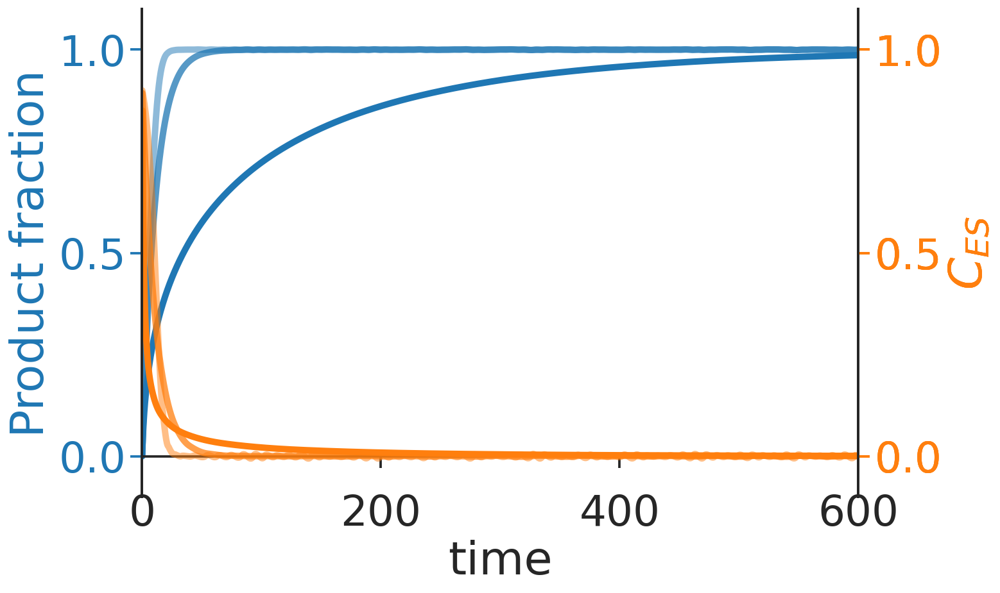

In [ ]:
# kep_list=[1e-2,1e-1,1,1e1]
# alphas=[1,.75,.5,.3]

kep_list=[1/20,1,10]
alphas=[1,.75,.5]

sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(10,7))

sol_list=[]

for i in range(len(kep_list)):
  kep=kep_list[i]
  alpha=alphas[i]
  params={
      'kcat':1,
      't_metabolite':10,
      'kes':1,
      'kep':kep,
      'te':1
  }

  t_init=0
  t_end=600
  npts=3000
  t_span=(t_init,t_end)
  t_eval=np.linspace(t_init,t_end,npts)
  y0=[0]

  func_int=lambda t,y:df(t,y,params)
  sol=solve_ivp(func_int,t_span,y0,t_eval=t_eval)
  sol_list=sol_list+[sol]


  ax.plot(sol.t,sol.y[0]/params['t_metabolite'],color=colors[0],lw=5,alpha=alpha)
  ax.set_xlabel(r'time')
  ax.set_ylabel(r'Product fraction')
  ax.set_ylim([-.1,1.1])
  ax.set_xlim([t_init,t_end])

  plt.locator_params(axis='y', nbins=3)

  ax2=ax.twinx()
  dt=(t_end-t_init)/npts
  ces=np.diff(sol.y[0])/dt/params['kcat']
  ax2.plot(sol.t[1:],ces,color=colors[1],lw=5,alpha=alpha)
  ax2.set_ylim([-0.1,1.1])
  # ax.set_yscale('log')
  ax2.set_ylabel(r'$C_{ES}$')

  #remove top and right borders
  ax.xaxis.set_tick_params(pad=20)
  ax.spines['bottom'].set_position('zero')
  ax2.spines['bottom'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax2.spines['top'].set_visible(False)
  #restrict number of ticks
  # plt.locator_params(axis='x', nbins=2)
  plt.locator_params(axis='y', nbins=3)


  ax.tick_params(axis='y', colors=colors[0])
  ax2.tick_params(axis='y', colors=colors[1])
  # ax.tick_params(axis='y', colors='#1f77b4')
  # ax2.tick_params(axis='y', colors='#ff7f0e')
  ax.yaxis.label.set_color(colors[0])
  ax2.yaxis.label.set_color(colors[1])

plt.savefig('enzyme-with-product-binding-ODE-sim.png', dpi=200, bbox_inches='tight')

In [ ]:
from google.colab import files
files.download('enzyme-with-product-binding-ODE-sim.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
temp=[np.where(sol.y[0]/params['t_metabolite']>0.9)[0][0] for sol in sol_list]
temp

[421, 43, 23]

### Plot the catalysis trajectories onto the reaction order polyhedron.

In [ ]:
def df_for_traj_recovery(y,params): #y it totals, t_P
  kcat=params['kcat']
  t_metabolite=params['t_metabolite']
  params_solve={
      'kes':params['kes'],
      'kep':params['kep'],
      'te':params['te'],
      'tp':y,
      'ts':t_metabolite-y
  }
  func_temp=lambda x:func(x,params_solve)
  root = fsolve(func_temp, [1, 1,1,1,1])
  return root


kep_list=[1/30,1,10]

logders_traj_list=[]

for i in range(len(sol_list)):
  sol=sol_list[i]
  kep=kep_list[i]
  params={
      'kcat':1,
      't_metabolite':10,
      'kes':1,
      'kep':kep,
      'te':1
  }
  npts_traj=len(sol.y[0])
  logders_traj=np.zeros((npts_traj,5))
  for i in range(npts_traj):
    y=sol.y[0,i]
    root=df_for_traj_recovery(y,params)
    temp=log_der_calc(root,l_mat,n_mat)
    logders_traj[i]=temp[3,:] #take the CES log der
  logders_traj_list=logders_traj_list+[logders_traj]

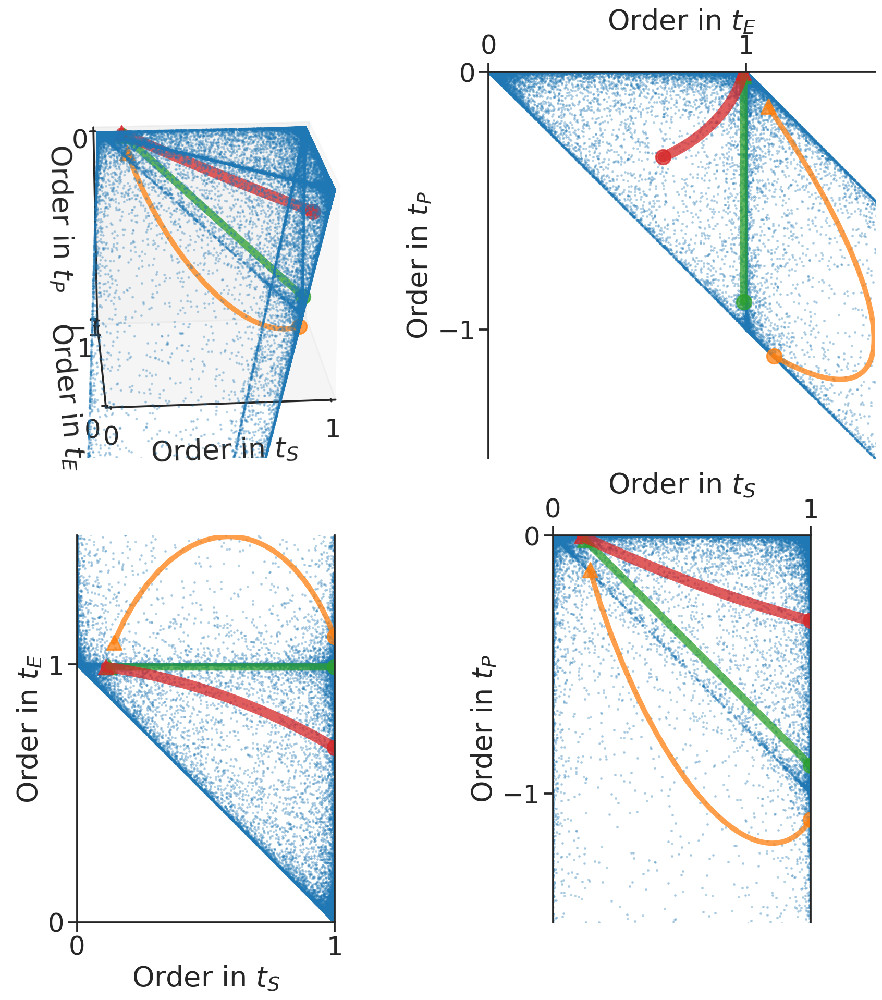

In [ ]:
t_pad=1
xs_traj_list=[logders_traj[t_pad:,1] for logders_traj in logders_traj_list]
ys_traj_list=[logders_traj[t_pad:,0] for logders_traj in logders_traj_list]
zs_traj_list=[logders_traj[t_pad:,2] for logders_traj in logders_traj_list]
# alpha_list=[1,.75,.5,.3]
# lw_list=[3,5,7,10]
# ntraj=4

alpha_list=[.75,.75,.75]
lw_list=[5,7,10]

# alpha_list=[1,1,1]
# lw_list=[5,5,5]
ntraj=3

sns.set_context('talk',font_scale=1.5,rc={'lines.linewidth':3})

fig = plt.figure(figsize=(15,15))

c_idx=3 #index for the active complex to be plotted.

xmin=0; xmax=1; 
ymin=0; ymax=1; 
zmin=-1; zmax=0; 


c_label='C_{ES}'

x_label='t_S'
y_label='t_E'
z_label='t_P'

# FRIST, plot a 3d view

ax = fig.add_subplot(2, 2, 1, projection='3d')
ax.grid(False)
xs=logders[:,c_idx,1]
ys=logders[:,c_idx,0]
zs=logders[:,c_idx,2]
ax.scatter(xs,ys,zs,s=1,alpha=0.3)


for i in range(3):
  ax.plot(xs_traj_list[i],ys_traj_list[i],zs_traj_list[i],lw=lw_list[i],alpha=alpha_list[i],color=colors[i+1])
  ax.scatter(xs_traj_list[i][-1],ys_traj_list[i][-1],zs_traj_list[i][-1],color=colors[i+1],alpha=alpha_list[i],s=200)
  ax.scatter(xs_traj_list[i][0],ys_traj_list[i][0],zs_traj_list[i][0],color=colors[i+1],marker='^',alpha=alpha_list[i],s=200)


# ax.set_xlabel(r'$\frac{\partial \log'+ c_label+'}{\partial \log'+x_label+'}$')
# ax.set_ylabel(r'$\frac{\partial \log'+ c_label+'}{\partial \log'+y_label+'}$')
# ax.set_zlabel(r'$\frac{\partial \log'+ c_label+'}{\partial \log'+z_label+'}$')
ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+y_label+'$')
ax.set_zlabel(r'Order in $'+z_label+'$')
ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax])
ax.set_zlim([zmin,zmax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin))
plt.locator_params(axis='y', nbins=int(ymax-ymin))
plt.locator_params(axis='z', nbins=int(zmax-zmin))

ax.xaxis.labelpad = 10
ax.yaxis.labelpad = 10
ax.zaxis.labelpad = 10

ax.view_init(20,-95)




xmin=0; xmax=1; 
ymin=0; ymax=1.5; 
zmin=-1.5; zmax=0; 

## SECOND, plot projection along the first (x) axis.
## so x-axis is 2nd axis, y-axis is 3rd axis.
ax = fig.add_subplot(2, 2, 2)
ax.set_aspect('equal')
ax.scatter(ys,zs,s=1,alpha=0.3)

for i in range(ntraj):
  ax.plot(ys_traj_list[i],zs_traj_list[i],lw=lw_list[i],alpha=alpha_list[i],color=colors[i+1])
  ax.scatter(ys_traj_list[i][-1],zs_traj_list[i][-1],color=colors[i+1],alpha=alpha_list[i],s=200)
  ax.scatter(ys_traj_list[i][0],zs_traj_list[i][0],color=colors[i+1],marker='^',alpha=alpha_list[i],s=200)

ax.set_xlabel(r'Order in $'+y_label+'$')
ax.set_ylabel(r'Order in $'+z_label+'$')
ax.set_xlim([ymin,ymax])
ax.set_ylim([zmin,zmax])

ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top') 
plt.locator_params(axis='x', nbins=int(ymax-ymin))
plt.locator_params(axis='y', nbins=int(zmax-zmin))

## THIRD, plot projection along the 3rd (z) axis.
## so x-axis is 2nd axis (y), y-axis is 1st axis (x).
ax = fig.add_subplot(2, 2, 3)
ax.set_aspect('equal')
ax.scatter(xs,ys,s=1,alpha=0.3)

for i in range(ntraj):
  ax.plot(xs_traj_list[i],ys_traj_list[i],lw=lw_list[i],alpha=alpha_list[i],color=colors[i+1])
  ax.scatter(xs_traj_list[i][-1],ys_traj_list[i][-1],color=colors[i+1],alpha=alpha_list[i],s=200)
  ax.scatter(xs_traj_list[i][0],ys_traj_list[i][0],color=colors[i+1],marker='^',alpha=alpha_list[i],s=200)

ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+y_label+'$')
ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax])

ax.spines['top'].set_visible(False)
plt.locator_params(axis='x', nbins=int(ymax-ymin))
plt.locator_params(axis='y', nbins=int(xmax-xmin))

## FOURTH, plot projection along the 2rd (y) axis.
## so x-axis is 1st axis (x), y-axis is 3nd axis (z).
ax = fig.add_subplot(2, 2, 4)
ax.set_aspect('equal')
ax.scatter(xs,zs,s=1,alpha=0.3)

for i in range(3):
  ax.plot(xs_traj_list[i],zs_traj_list[i],lw=lw_list[i],alpha=alpha_list[i],color=colors[i+1])
  ax.scatter(xs_traj_list[i][-1],zs_traj_list[i][-1],color=colors[i+1],alpha=alpha_list[i],s=200)
  ax.scatter(xs_traj_list[i][0],zs_traj_list[i][0],color=colors[i+1],marker='^',alpha=alpha_list[i],s=200)

ax.set_xlabel(r'Order in $'+x_label+'$')
ax.set_ylabel(r'Order in $'+z_label+'$')
ax.set_xlim([xmin,xmax])
ax.set_ylim([zmin,zmax])

ax.spines['bottom'].set_visible(False)
# ax.spines['right'].set_visible(False)
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top') 
plt.locator_params(axis='x', nbins=int(xmax-xmin))
plt.locator_params(axis='y', nbins=int(zmax-zmin))

plt.savefig('enzyme-with-product-binding-with-trajs.png', dpi=200, bbox_inches='tight')

In [ ]:
from google.colab import files
files.download('enzyme-with-product-binding-with-trajs.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Induced activator.
A transcription factor activator \\(R\\) induced by inducer \\(S\\), and activates gene \\(G\\). 

Binding reactions are \\(R+S \rightleftharpoons C_{RS}\\), \\(G+C_{RS} \rightleftharpoons C_{GRS}\\).

Order species by \\((G,R,S,C_{RS},C_{GRS})\\). 

Stoichiometry matrix is
\\(N = \begin{bmatrix} 0 & -1 & -1 & 1 & 0 \\ -1 & 0 & 0 & -1 & 1 \end{bmatrix}\\).

Order totals by \\((t_G,t_R,t_S)\\).

Conservation law matrix is
\\(L = \begin{bmatrix} 1 & 0 & 0 & 0 & 1 \\ 0 & 1 & 0 & 1 & 1 \\ 0 & 0 & 1 & 1 & 1 \end{bmatrix}\\).

In [ ]:
n_mat=np.array([[0,-1,-1,1,0],
                [-1,0,0,-1,1]])
l_mat=l_from_n(n_mat)

In [ ]:
d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

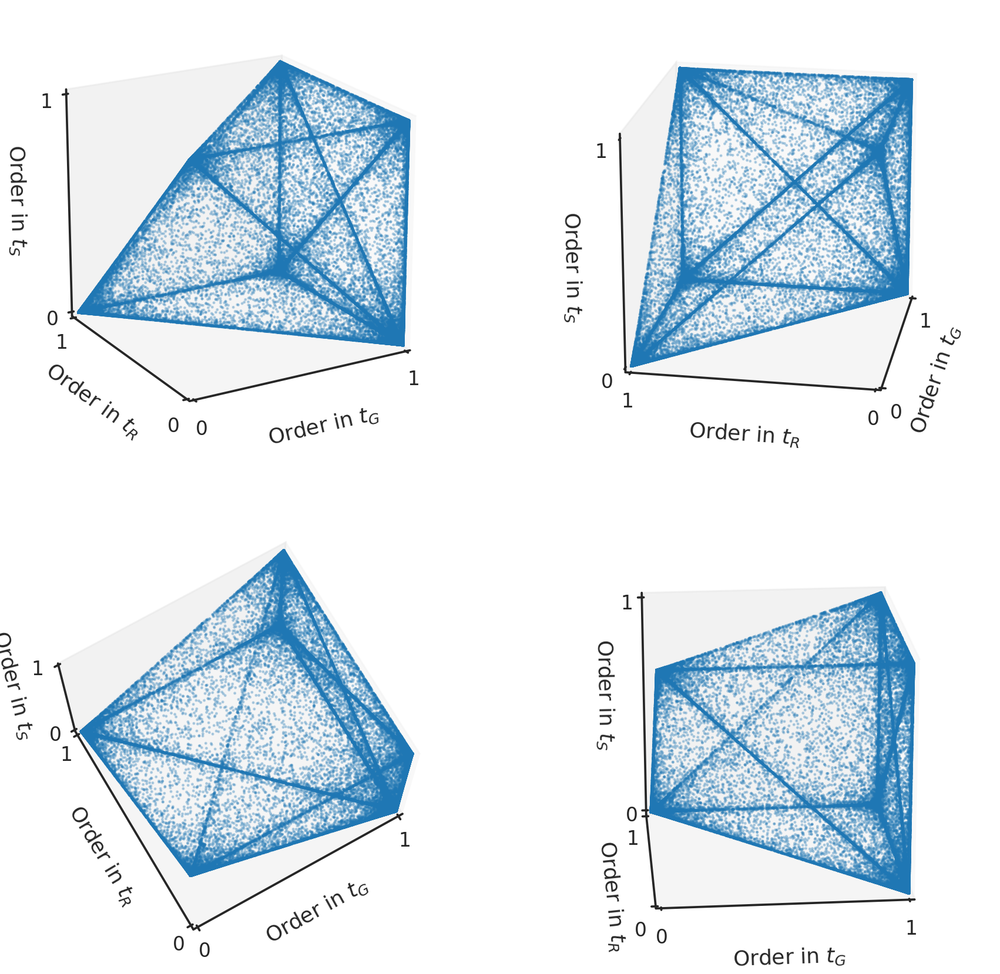

In [ ]:

sns.set_context('talk',font_scale=1,rc={'lines.linewidth':3})

fig = plt.figure(figsize=(15,15))

c_idx=4 #index for the active complex to be plotted.

xmin=0; xmax=1; 
ymin=0; ymax=1; 
zmin=0; zmax=1; 


c_label='C_{GRS}'

x_label='t_G'
y_label='t_R'
z_label='t_S'

views=[(20,-120),(20,-170),(75,-120),(20,-95)]

nn=100000

for i in range(4):
  ax = fig.add_subplot(2, 2, i+1, projection='3d')
  ax.scatter(logders[:nn,c_idx,0],logders[:nn,c_idx,1],logders[:nn,c_idx,2],s=1,alpha=0.3)
  ax.set_xlabel(r'Order in $'+x_label+'$')
  ax.set_ylabel(r'Order in $'+y_label+'$')
  ax.set_zlabel(r'Order in $'+z_label+'$')
  ax.set_xlim([xmin,xmax])
  ax.set_ylim([ymin,ymax])
  ax.set_zlim([zmin,zmax])

  #remove top and right borders
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  #restrict number of ticks

  plt.locator_params(axis='x', nbins=1)
  plt.locator_params(axis='y', nbins=1)
  plt.locator_params(axis='z', nbins=1)

  ax.xaxis.labelpad = 10
  ax.yaxis.labelpad = 10
  ax.zaxis.labelpad = 10

  view=views[i]
  ax.view_init(view[0],view[1])

  ax.grid(False)
plt.savefig('induced-activator-sampling-transparent.png', dpi=200, bbox_inches='tight',transparent=True)

In [ ]:
from google.colab import files
files.download('induced-activator-sampling-transparent.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Enzyme allostery

Here we investigate the various cases of binding to several substrates. 
(1) simple one step binding, \\(E_0+nS \rightleftharpoons E_n\\).
This case has \\(N = \begin{bmatrix} -1 & -n & 1 \end{bmatrix}\\), \\(L = \begin{bmatrix} 1 & 0 & 1 \\ 0 & 1 & n \end{bmatrix}\\).

In [ ]:
param_n=2

l_mat=np.array([[1,0,1],
                [0,1,param_n]])
n_mat=np.array([[1,param_n,-1]])
d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

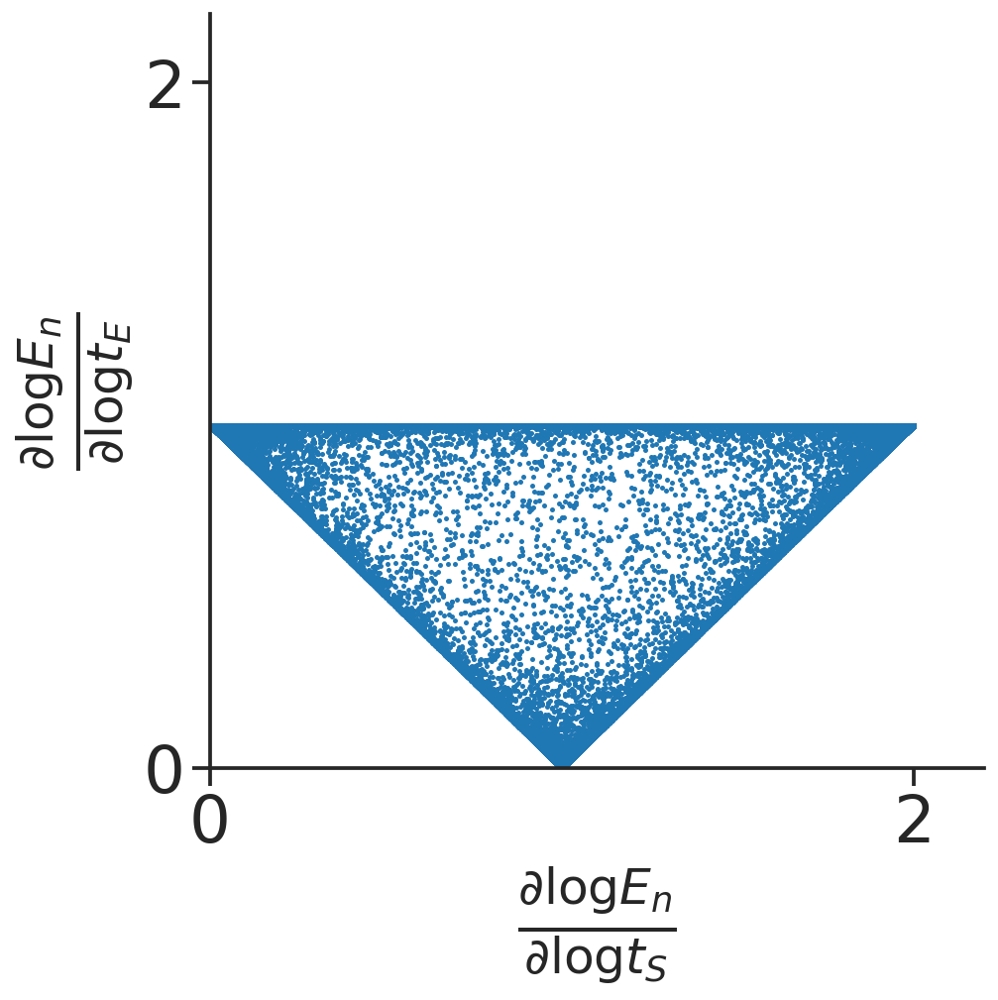

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.scatter(logders[:,2,1],logders[:,2,0],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_n}{\partial \log t_S}$')
ax.set_ylabel(r'$\frac{\partial \log E_n}{\partial \log t_E}$')

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=2)
plt.locator_params(axis='y', nbins=2)

ax.set_xlim([0,2.2])
ax.set_ylim([0,2.2])
handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

Second case. (2) group binding, \\(nS \rightleftharpoons S_n\), \\(E_0+S_n \rightleftharpoons E_n\\).
Order species by \\((E_0,S,S_n,E_n)\\), order totals by \\((t_E,t_S)\\).
This case has \\(N = \begin{bmatrix} -1 & 0 & -1 & 1 \\ 0 & -n & 1 & 0 \end{bmatrix}\\), \\(L = \begin{bmatrix} 1 & 0 & 0 & 1 \\ 0 & 1 & n & n \end{bmatrix}\\).

In [ ]:
param_n=2

l_mat=np.array([[1,0,0,1],
                [0,1,param_n,param_n]])
n_mat=np.array([[-1,0,-1,1],
                [0,-param_n,1,0]])
d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

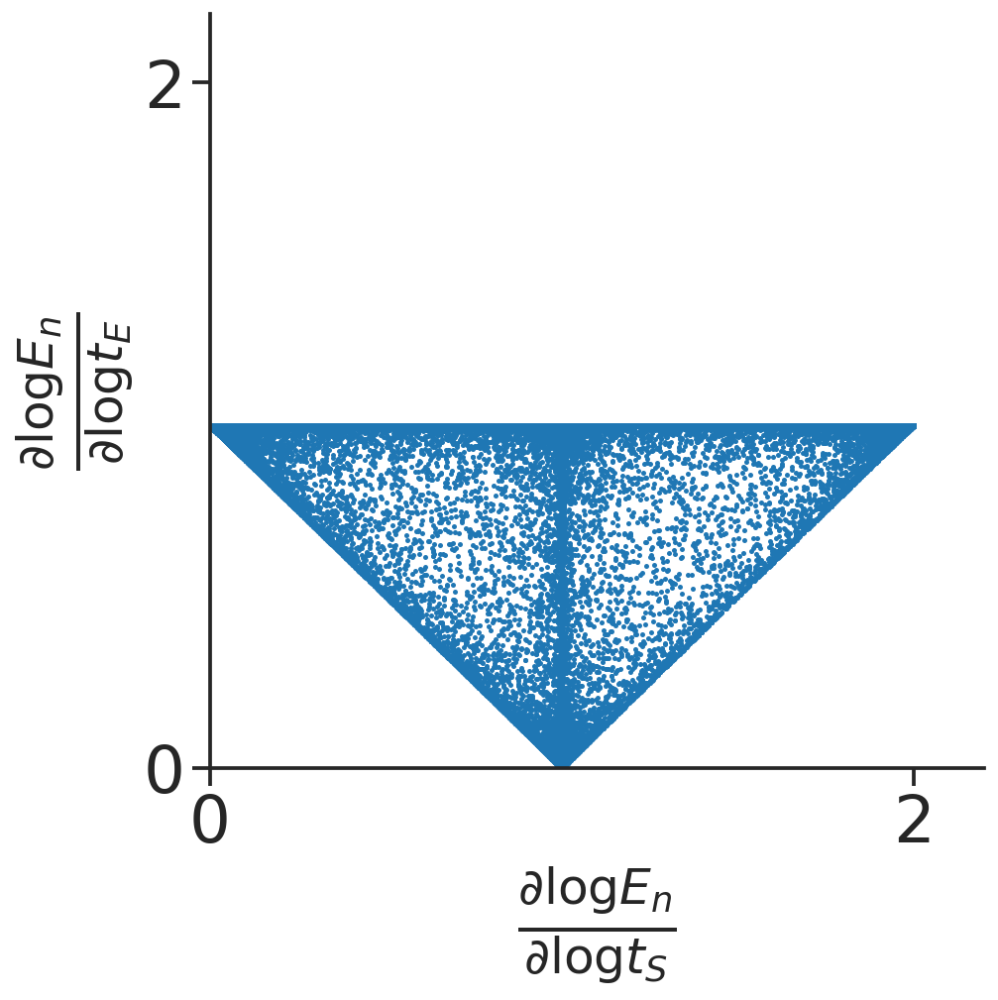

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.scatter(logders[:,3,1],logders[:,3,0],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_n}{\partial \log t_S}$')
ax.set_ylabel(r'$\frac{\partial \log E_n}{\partial \log t_E}$')

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=2)
plt.locator_params(axis='y', nbins=2)

ax.set_xlim([0,2.2])
ax.set_ylim([0,2.2])
handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

Third case. (3) one-by-one binding, 
\\(E_0+S \rightleftharpoons E_1\\), ..., \\(E_{n-1} + S \rightleftharpoons E_n\\)
Order species by \\((S,E_0,E_1,\dots,E_n)\\), order totals by \\((t_S,t_E)\\).
For \(n=2\), this case has \\(N = \begin{bmatrix} -1 & -1 & 1 & 0 \\ -1 & 0 & -1 & 1  \end{bmatrix}\\), 
\\(L = \begin{bmatrix} 1 & 0 & 1 & 2 \\ 0 & 1 & 1 & 1 \end{bmatrix}\\).

In [ ]:
l_mat=np.array([[1,0,1,2],
                [0,1,1,1]])
n_mat=np.array([[1,1,-1,0],
                [1,0,1,-1]])
d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-10
x_max_log10=0
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

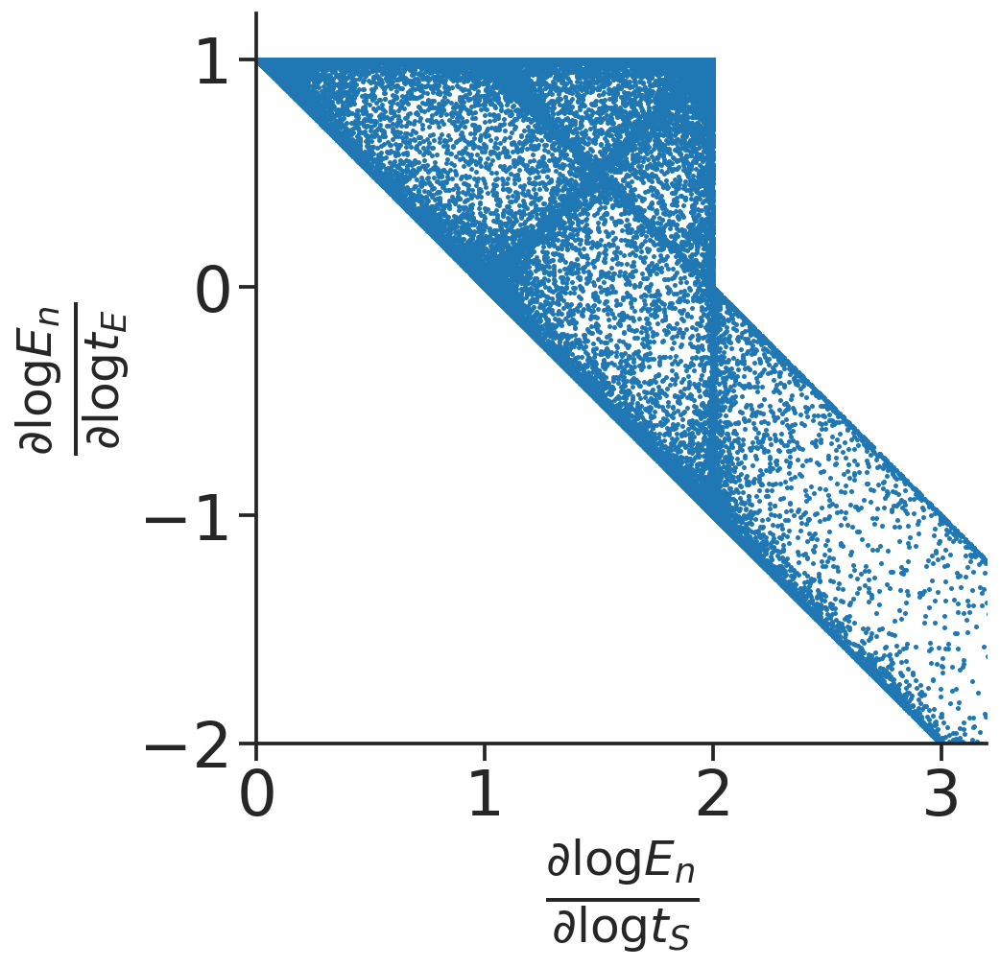

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,3,0],logders[:,3,1],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_n}{\partial \log t_S}$')
ax.set_ylabel(r'$\frac{\partial \log E_n}{\partial \log t_E}$')

xmin=0; xmax=3.2; ax.set_xlim([xmin,xmax])
ymin=-2; ymax=1.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

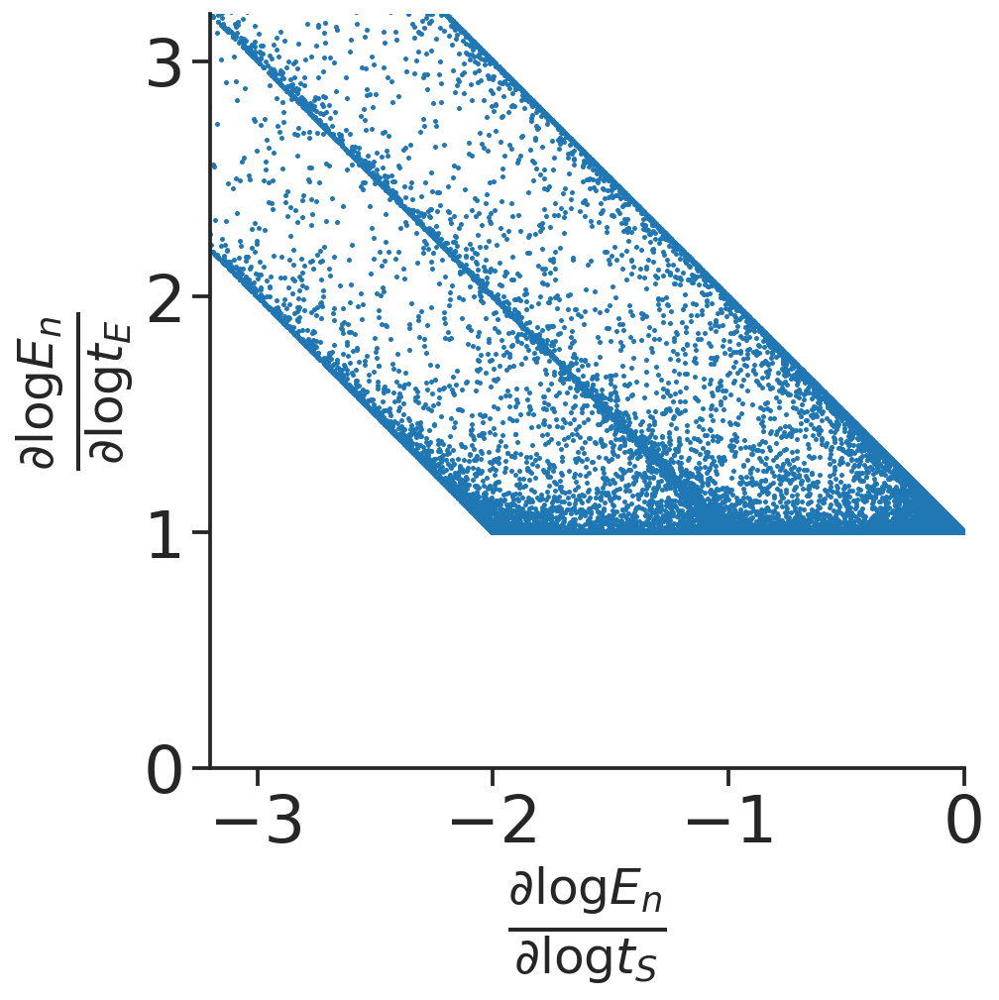

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,1,0],logders[:,1,1],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_n}{\partial \log t_S}$')
ax.set_ylabel(r'$\frac{\partial \log E_n}{\partial \log t_E}$')

xmin=-3.2; xmax=0; ax.set_xlim([xmin,xmax])
ymin=0; ymax=3.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

Third case. (3) one-by-one binding, 
\\(E_0+S \rightleftharpoons E_1\\), ..., \\(E_{n-1} + S \rightleftharpoons E_n\\)
Order species by \\((S,E_0,E_1,\dots,E_n)\\), order totals by \\((t_S,t_E)\\).
For \(n=3\), this case has \\(N = \begin{bmatrix} -1 & -1 & 1 & 0 & 0 \\ -1 & 0 & -1 & 1 & 0 \\ -1 & 0 & 0 & -1 & 1 \end{bmatrix}\\), 
\\(L = \begin{bmatrix} 1 & 0 & 1 & 2 & 3 \\ 0 & 1 & 1 & 1 & 1 \end{bmatrix}\\).

In [ ]:
l_mat=np.array([[1,0,1,2,3],
                [0,1,1,1,1]])
n_mat=np.array([[-1,-1,1,0,0],
                [-1,0,-1,1,0],
                [-1,0,0,-1,1]])
d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

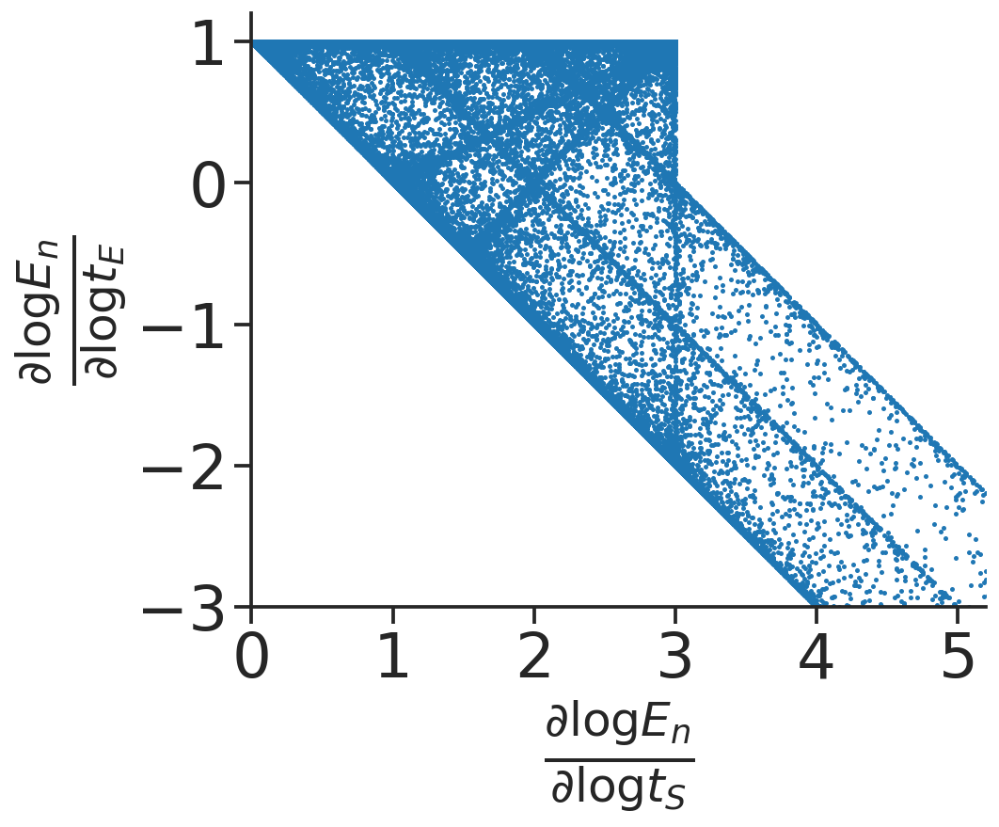

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,4,0],logders[:,4,1],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_n}{\partial \log t_S}$')
ax.set_ylabel(r'$\frac{\partial \log E_n}{\partial \log t_E}$')

xmin=0; xmax=5.2; ax.set_xlim([xmin,xmax])
ymin=-3; ymax=1.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

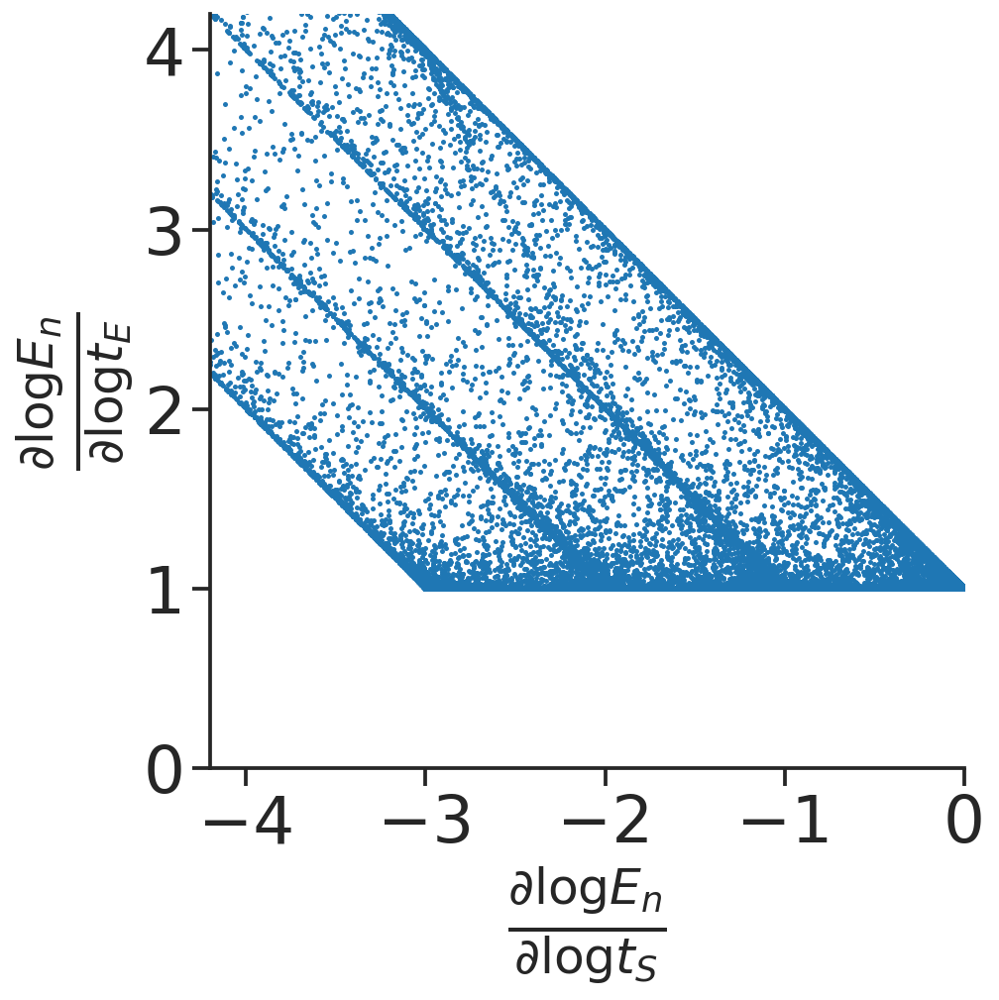

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,1,0],logders[:,1,1],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_n}{\partial \log t_S}$')
ax.set_ylabel(r'$\frac{\partial \log E_n}{\partial \log t_E}$')

xmin=-4.2; xmax=0; ax.set_xlim([xmin,xmax])
ymin=0; ymax=4.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

(4) multisite one-by-one binding, 
\\(E_{00}+S \rightleftharpoons E_{01}\\), \\(E_{00} + S \rightleftharpoons E_{10}\\),
\\(E_{01} + S \rightleftharpoons E_{11}\\), \\(E_{11} + S \rightleftharpoons E_{11}\\).
Order species by \\((S,E_{00},E_{01},E_{10},E_{11})\\), order totals by \\((t_S,t_E)\\).
This case has \\(N = \begin{bmatrix} -1 & -1 & 1 & 0 & 0 \\ -1 & -1 & 0 & 1 & 0 \\ -1 & 0 & -1 & 0 & 1 \\ -1 & 0 & 0 & -1 & 1 \end{bmatrix}\\), 
\\(L = \begin{bmatrix} 1 & 0 & 1 & 1 & 2 \\ 0 & 1 & 1 & 1 & 1 \end{bmatrix}\\).

In [ ]:
l_mat=np.array([[1,0,1,1,2],
                [0,1,1,1,1]])
# n_mat=np.array([[-1,-1,1,0,0],
#                 [-1,-1,0,1,0],
#                 [-1,0,-1,0,1],
#                 [-1,0,0,-1,1]])

n_mat=np.array([[-1,-1,1,0,0],
                [-1,-1,0,1,0],
                [-1,0,0,-1,1]])

d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

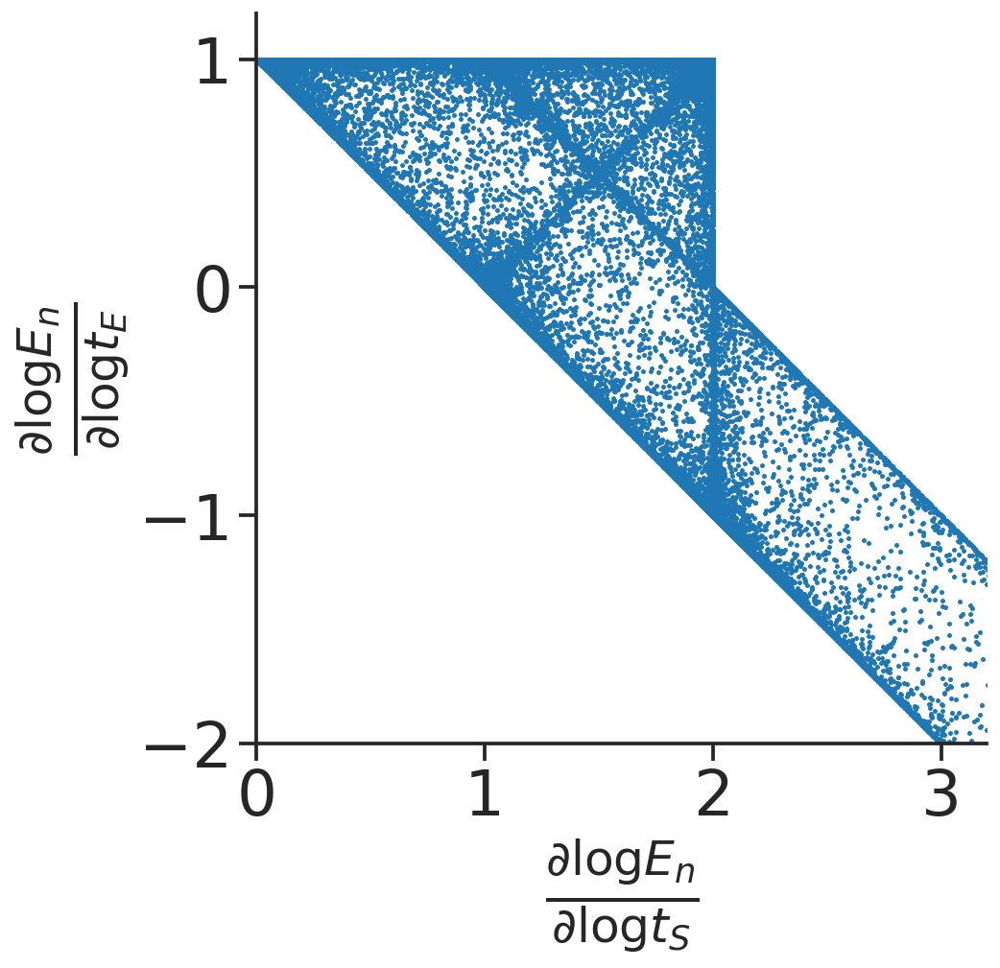

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,4,0],logders[:,4,1],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_n}{\partial \log t_S}$')
ax.set_ylabel(r'$\frac{\partial \log E_n}{\partial \log t_E}$')

xmin=0; xmax=3.2; ax.set_xlim([xmin,xmax])
ymin=-2; ymax=1.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

Phosphorylation. \\(X_p + Y \rightleftharpoons C \rightleftharpoons X + Y_p\\).
Order species by \\((X,X_p,Y,Y_p,C)\\). Order totals by \\(t_X,t_Y,t_p\\). We have 
\\(N = \begin{bmatrix} -1 & 0 & 0 & -1 & 1 \\ 0 & -1 & -1 & 0 & 1 \end{bmatrix}\\).
\\(L = \begin{bmatrix} 1 & 1 & 0 & 0 & 1 \\ 0 & 0 & 1 & 1 & 1 \\ 0 & 1 & 0 & 1 & 1 \end{bmatrix}\\).

In [ ]:
l_mat=np.array([[1,1,0,0,1],
                [0,0,1,1,1],
                [0,1,0,1,1]])
n_mat=np.array([[-1,0,0,-1,1],
                [0,-1,-1,0,1]])

d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-8
x_max_log10=8
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

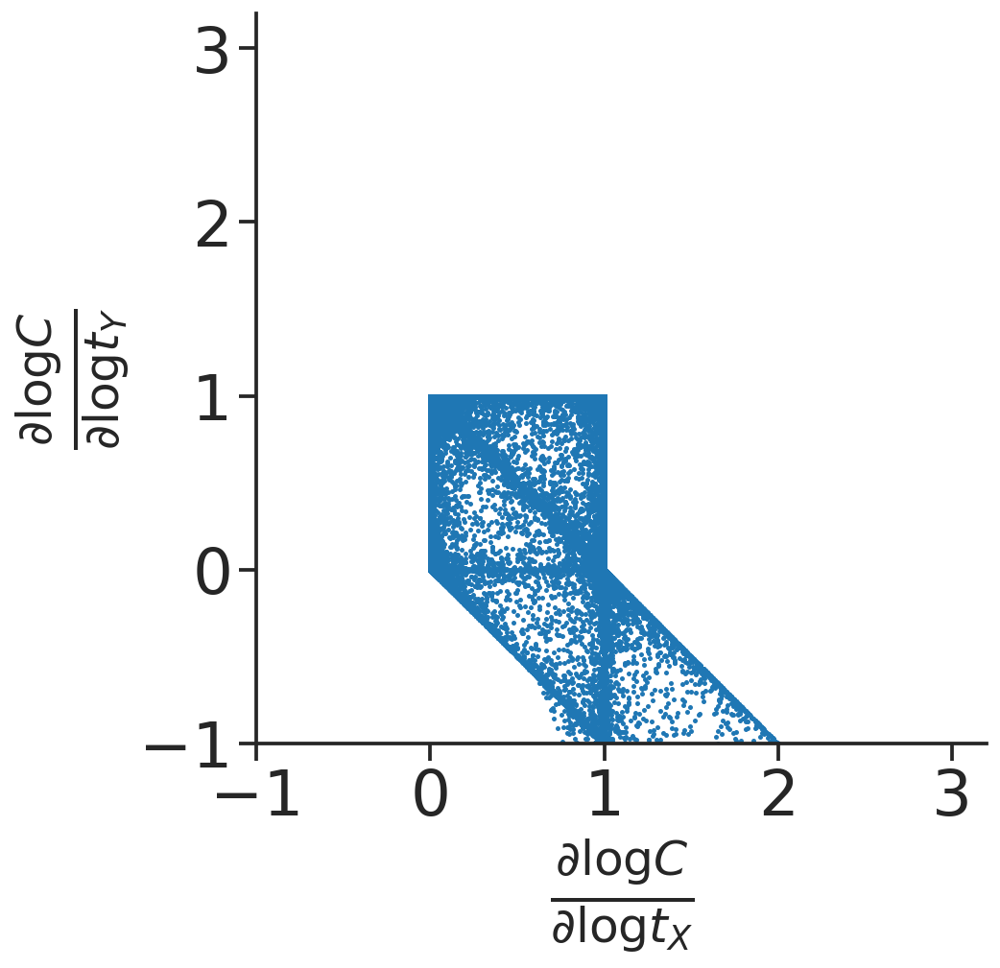

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,4,0],logders[:,4,2],s=1)
ax.set_xlabel(r'$\frac{\partial \log C}{\partial \log t_X}$')
ax.set_ylabel(r'$\frac{\partial \log C}{\partial \log t_Y}$')

xmin=-1; xmax=3.2; ax.set_xlim([xmin,xmax])
ymin=-1; ymax=3.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

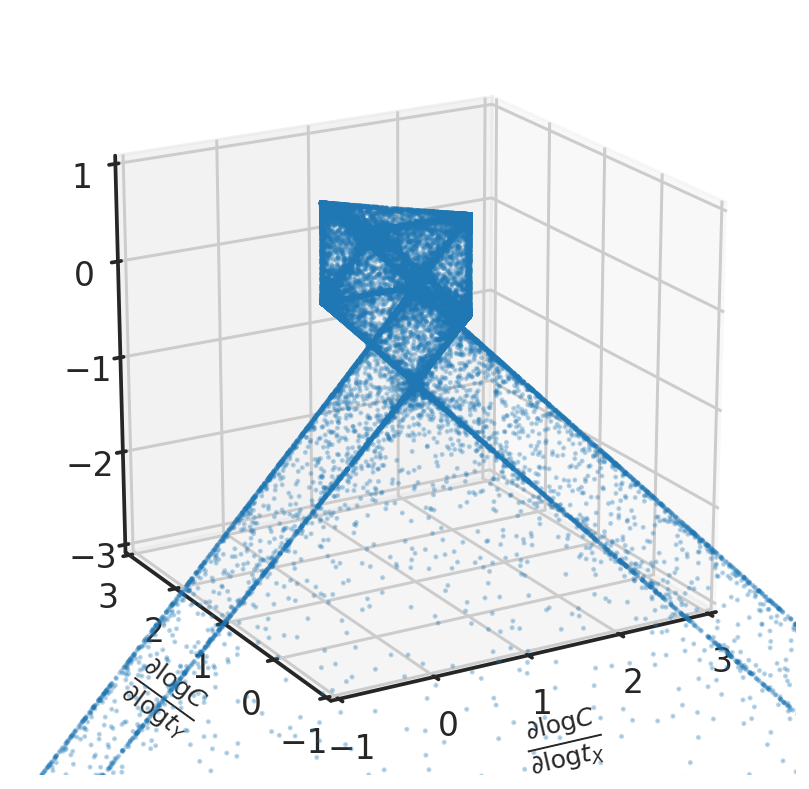

In [ ]:
sns.set_context('talk',font_scale=1,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax = plt.axes(projection='3d')
ax.scatter(logders[:,4,0],logders[:,4,1],logders[:,4,2],s=1,alpha=0.3)
ax.set_xlabel(r'$\frac{\partial \log C}{\partial \log t_X}$')
ax.set_ylabel(r'$\frac{\partial \log C}{\partial \log t_Y}$')

xmin=-1; xmax=3; ax.set_xlim([xmin,xmax])
ymin=-1; ymax=3; ax.set_ylim([ymin,ymax])
zmin=-3; zmax=1; ax.set_zlim([zmin,zmax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)
plt.locator_params(axis='z', nbins=int(zmax-zmin)+1)

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')


ax.xaxis.labelpad = 10
ax.yaxis.labelpad = 10
ax.zaxis.labelpad = 10
ax.view_init(20, -120)



One-by-one binding of two different substrates.
\\(E_0+S_1 \rightleftharpoons E_1\\), \\(E_1 + S_2 \rightleftharpoons E_2 \\).
Order species by \\((S_1,S_2,E_0,E_1,E_2)\\), order totals by \\((t_{S1},t_{S2},t_E)\\). 
\\(N = \begin{bmatrix} -1 & 0 & -1 & 1 & 0 \\ 0 & -1 & 0 & -1 & 1  \end{bmatrix}\\), 
\\(L = \begin{bmatrix} 1 & 0 & 0 & 1 & 1 \\ 0 & 1 & 0 &  0 & 1 \\ 0 & 0 & 1 & 1 & 1 \end{bmatrix}\\).

In [ ]:
l_mat=np.array([[1,0,0,1,1],
                [0,1,0,0,1],
                [0,0,1,1,1]])
n_mat=np.array([[-1,0,-1,1,0],
                [0,-1,0,-1,1]])

d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-8
x_max_log10=8
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

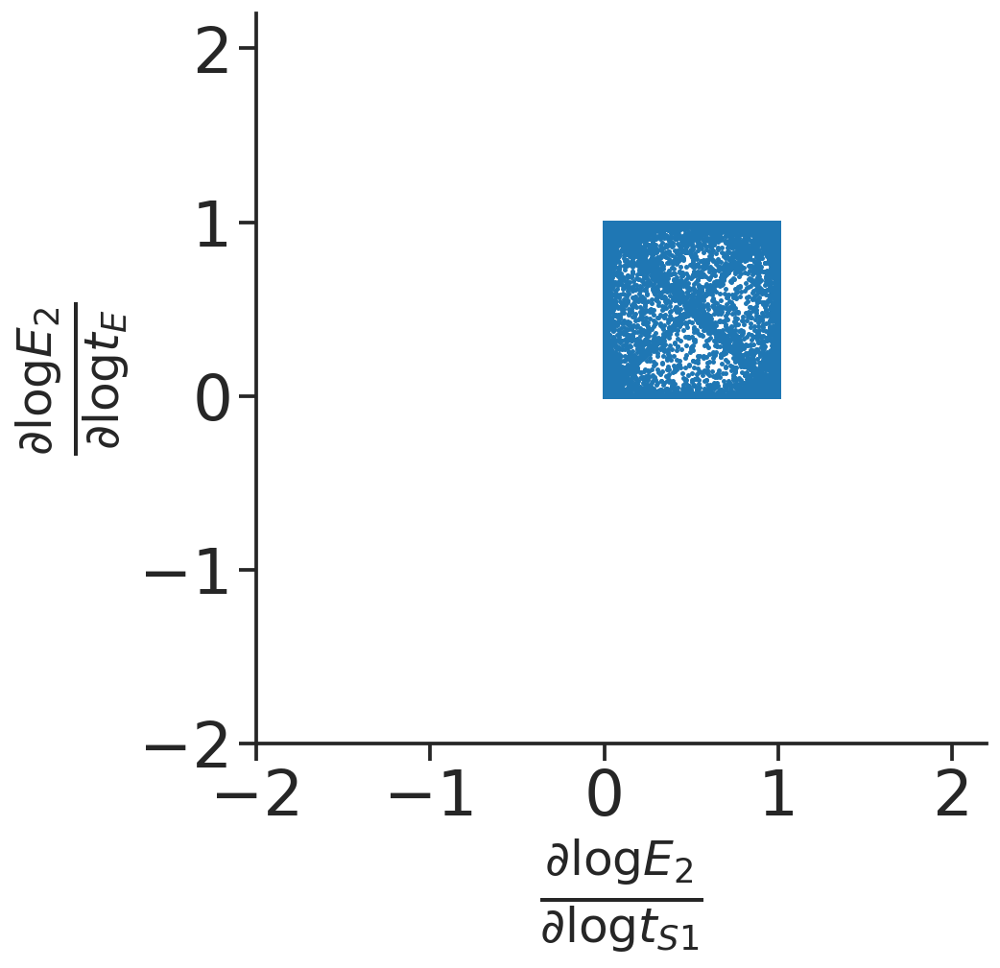

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,4,0],logders[:,4,1],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_2}{\partial \log t_{S1}}$')
ax.set_ylabel(r'$\frac{\partial \log E_2}{\partial \log t_E}$')

xmin=-2; xmax=2.2; ax.set_xlim([xmin,xmax])
ymin=-2; ymax=2.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,4,0],logders[:,4,2],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_2}{\partial \log t_{S1}}$')
ax.set_ylabel(r'$\frac{\partial \log E_2}{\partial \log t_E}$')

xmin=-2; xmax=2.2; ax.set_xlim([xmin,xmax])
ymin=-1; ymax=3.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

### Ron's circuit, A2. Order of species, \\(A,B,A_2,B_2,C_{AB}\\).

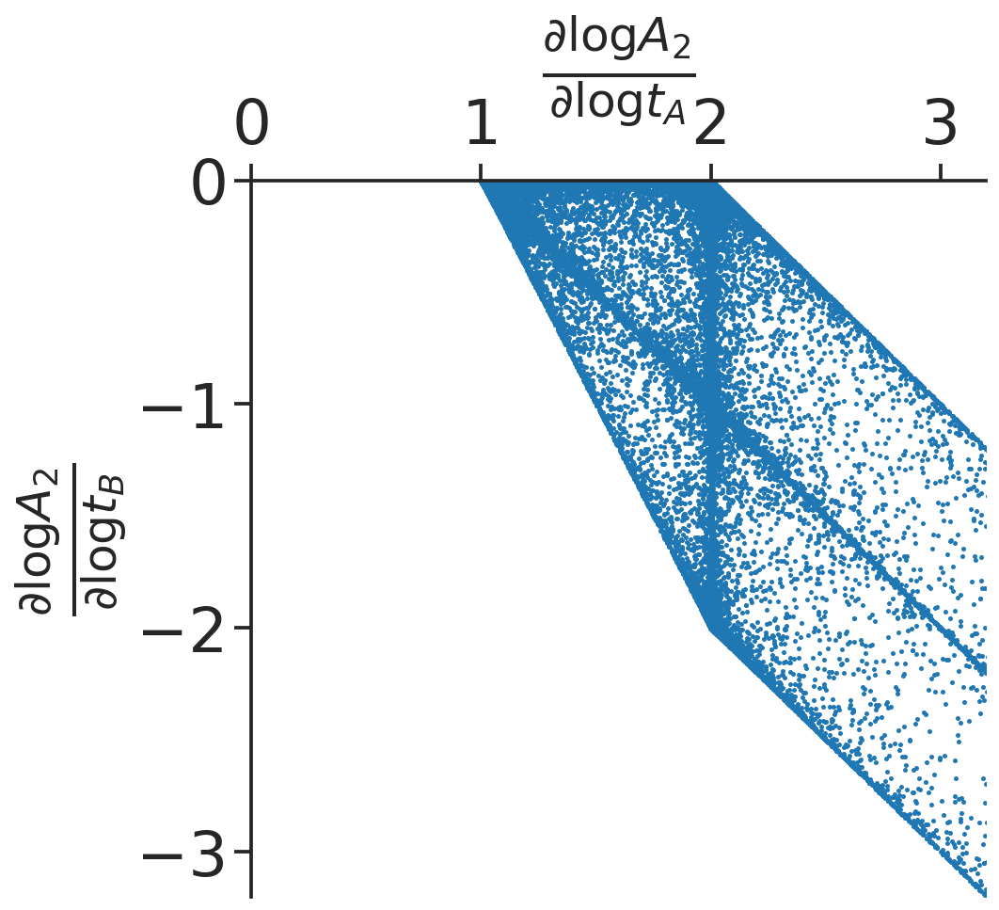

In [ ]:
l_mat=np.array([[1,0,2,0,1],
                [0,1,0,2,1]])
n_mat=np.array([[-2,0,1,0,0],
                [0,-2,0,1,0],
                [-1,-1,0,0,1]])
d_dim,n_dim=l_mat.shape

n_pts=100000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])

for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
species_idx=2
ax.scatter(logders[:,species_idx,0],logders[:,species_idx,1],s=1)
ax.set_xlabel(r'$\frac{\partial \log A_2}{\partial \log t_A}$')
ax.set_ylabel(r'$\frac{\partial \log A_2}{\partial \log t_B}$')

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=4)
plt.locator_params(axis='y', nbins=4)

ax.set_xlim([0,3.2])
ax.set_ylim([-3.2,0])

ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top') 
ax.spines['left'].set_position('zero')
ax.spines['bottom'].set_position('zero')

handles, labels = ax.get_legend_handles_labels()
# plt.savefig('C-log-der-tE-tS-sampling.pdf', bbox_inches='tight')

## Enzyme allostery using atomic species to constrain binding constant.

One-by-one binding, 
\\(E_0+S \rightleftharpoons E_1\\), ..., \\(E_{n-1} + S \rightleftharpoons E_n\\)
Order species by \\((S,E_0,E_1,\dots,E_n)\\), order totals by \\((t_S,t_E)\\).

For \(n=2\), this case has \\(N = \begin{bmatrix} -1 & -1 & 1 & 0 \\ -1 & 0 & -1 & 1  \end{bmatrix}\\), 
\\(L = \begin{bmatrix} 1 & 0 & 1 & 2 \\ 0 & 1 & 1 & 1 \end{bmatrix}\\).

In [ ]:
l_mat=np.array([[1,0,1,2],
                [0,1,1,1]])
n_mat=np.array([[1,1,-1,0],
                [1,0,1,-1]])
d_dim,n_dim=l_mat.shape
r_dim=n_dim-d_dim

n_pts=50000
xa_min_log10=-6
xa_max_log10=6
k_min_log10=-6
k_max_log10=6
xa=10**(np.random.rand(n_pts,d_dim)*(xa_max_log10 - xa_min_log10)+xa_min_log10)
k = 10**(np.random.rand(n_pts,r_dim)*(k_max_log10 - k_min_log10)+k_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
xx=np.zeros([n_pts,n_dim])
for i in range(n_pts):
  xx[i],logders[i]=log_der_calc_atomic(xa[i],k[i],l_mat,n_mat)

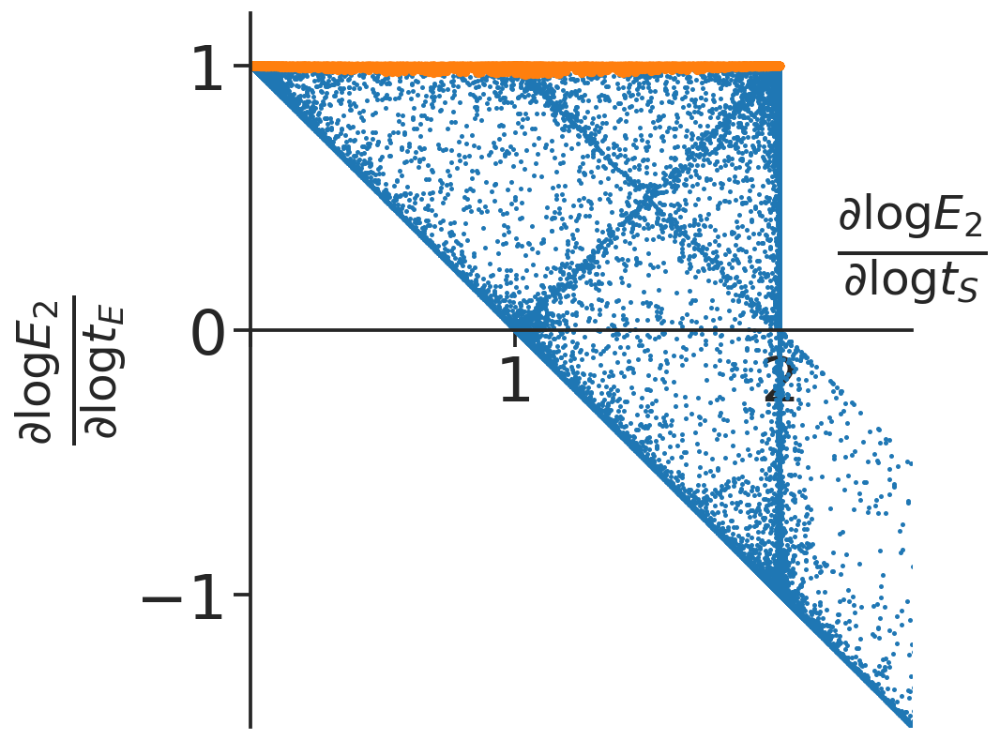

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,3,0],logders[:,3,1],s=1)
ax.set_xlabel(r'$\frac{\partial \log E_2}{\partial \log t_S}$')
ax.xaxis.set_label_coords(1, .75)
ax.set_ylabel(r'$\frac{\partial \log E_2}{\partial \log t_E}$')

xmin=0; xmax=2.5; ax.set_xlim([xmin,xmax])
ymin=-1.5; ymax=1.2; ax.set_ylim([ymin,ymax])

# to get the points that satisfy MWC assumption.
# MWC corresponds to the case that total substrate is much more than total enzyme
tt=(l_mat.dot(xx.T)).T
mwc_idx=np.where(tt[:,0]/tt[:,1] > 30)
ax.scatter(logders[mwc_idx,3,0],logders[mwc_idx,3,1],s=10,color=colors[1])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.spines['left'].set_position('zero')
ax.spines['bottom'].set_position('zero')

ax.xaxis.set_ticklabels(['',1,2])

#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

handles, labels = ax.get_legend_handles_labels()
plt.savefig('enzyme-allostery-logder-sampling.png', dpi=200, bbox_inches='tight')

In [ ]:
from google.colab import files
files.download('enzyme-allostery-logder-sampling.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Now we allow \\(K_1\\) and \\(K_2\\) to vary, but they always have the same value.

In [ ]:
l_mat=np.array([[1,0,1,2],
                [0,1,1,1]])
n_mat=np.array([[1,1,-1,0],
                [1,0,1,-1]])
d_dim,n_dim=l_mat.shape
r_dim=n_dim-d_dim

n_pts=50000
xa_min_log10=-6
xa_max_log10=6
kr_log10=0
k1_min_log10=-6
k1_max_log10=6
xa=10**(np.random.rand(n_pts,d_dim)*(xa_max_log10 - xa_min_log10)+xa_min_log10)
k=np.zeros([n_pts,r_dim])
k[:,0] = 10**(np.random.rand(n_pts)*(k1_max_log10 - k1_min_log10)+k1_min_log10)
k[:,1] = k[:,0]*10**(kr_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
xx=np.zeros([n_pts,n_dim])
for i in range(n_pts):
  xx[i],logders[i]=log_der_calc_atomic(xa[i],k[i],l_mat,n_mat)

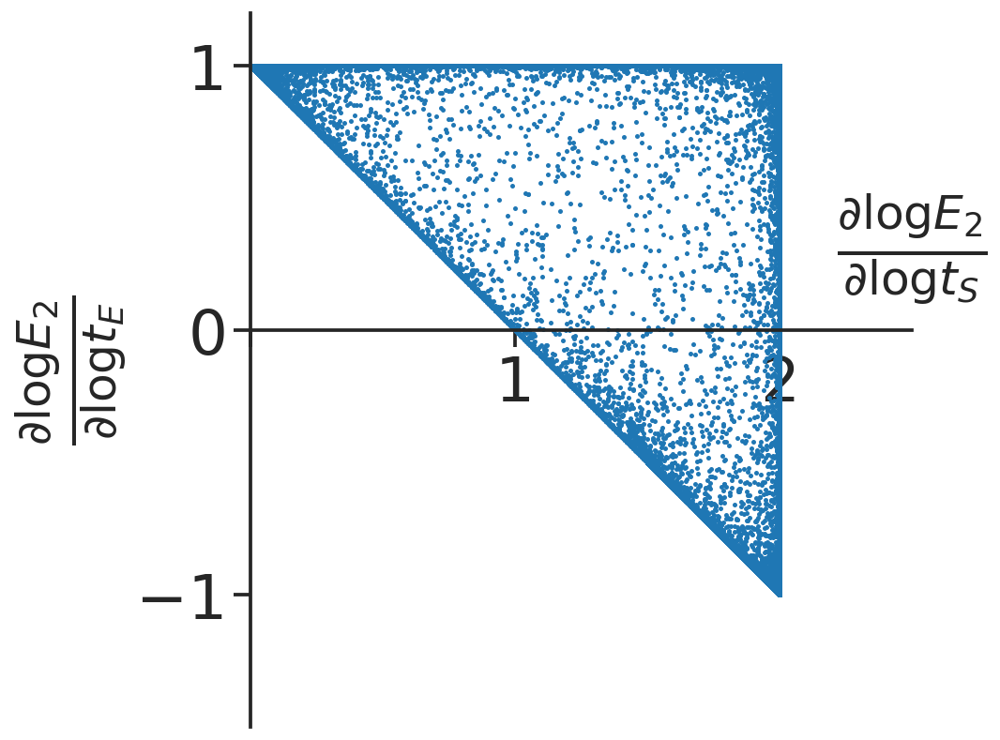

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,3,0],logders[:,3,1],s=1,color=colors[0])
ax.set_xlabel(r'$\frac{\partial \log E_2}{\partial \log t_S}$')
ax.xaxis.set_label_coords(1, .75)
ax.set_ylabel(r'$\frac{\partial \log E_2}{\partial \log t_E}$')

xmin=0; xmax=2.5; ax.set_xlim([xmin,xmax])
ymin=-1.5; ymax=1.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

ax.spines['left'].set_position('zero')
ax.spines['bottom'].set_position('zero')
ax.xaxis.set_ticklabels(['',1,2])

handles, labels = ax.get_legend_handles_labels()
plt.savefig('enzyme-allostery-logder-sampling-same-K.png', dpi=200, bbox_inches='tight')

In [ ]:
from google.colab import files
files.download('enzyme-allostery-logder-sampling-same-K.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Here we investigate the various cases of binding to several substrates. 
(1) simple one step binding, \\(E_0+nS \rightleftharpoons E_n\\).

Order: \\((E_0,S,E_n)\\), \\((t_S,t_E)\\).

This case has \\(N = \begin{bmatrix} -1 & -n & 1 \end{bmatrix}\\), \\(L = \begin{bmatrix} 0 & 1 & n \\ 1 & 0 & 1 \end{bmatrix}\\).

In [ ]:
param_n=2

l_mat=np.array([[0,1,param_n],
                [1,0,1]])
n_mat=np.array([[1,param_n,-1]])
d_dim,n_dim=l_mat.shape

n_pts=50000
x_min_log10=-6
x_max_log10=6
xx=10**(np.random.rand(n_pts,n_dim)*(x_max_log10 - x_min_log10)+x_min_log10)
logders=np.zeros([n_pts,n_dim,n_dim])
for i in range(n_pts):
  logders[i]=log_der_calc(xx[i],l_mat,n_mat)

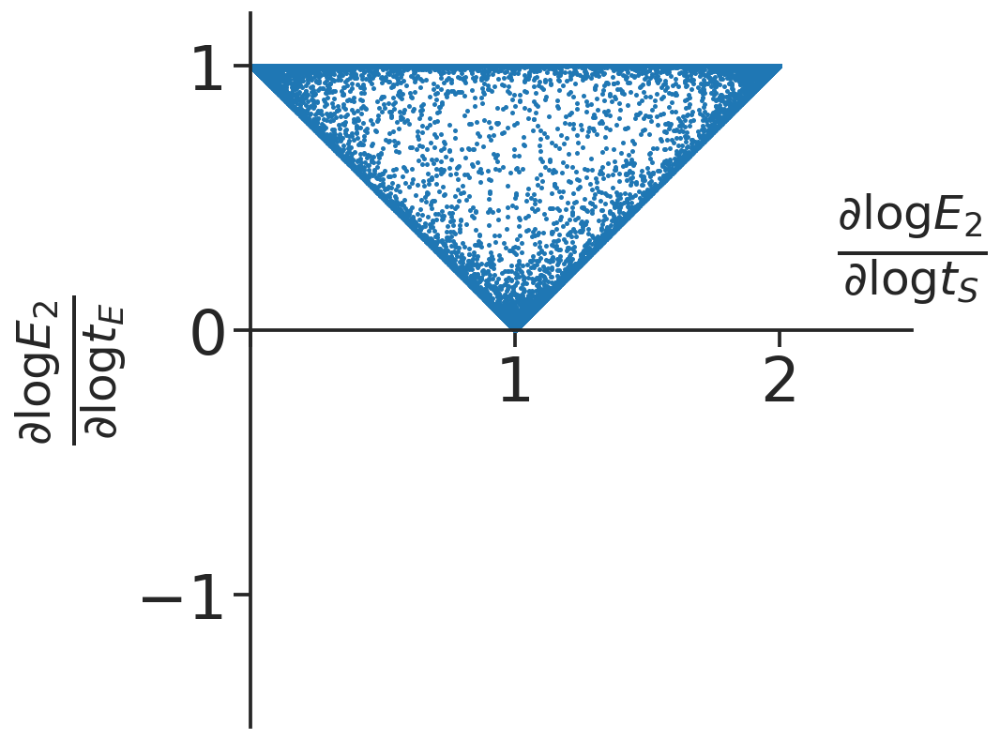

In [ ]:
sns.set_context('talk',font_scale=2,rc={'lines.linewidth':3})

fig, ax = plt.subplots(1, 1,figsize=(7,7))
ax.set_aspect('equal')
ax.scatter(logders[:,2,0],logders[:,2,1],s=1,color=colors[0])
ax.set_xlabel(r'$\frac{\partial \log E_2}{\partial \log t_S}$')
ax.xaxis.set_label_coords(1, .75)
ax.set_ylabel(r'$\frac{\partial \log E_2}{\partial \log t_E}$')

xmin=0; xmax=2.5; ax.set_xlim([xmin,xmax])
ymin=-1.5; ymax=1.2; ax.set_ylim([ymin,ymax])

#remove top and right borders
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#restrict number of ticks
plt.locator_params(axis='x', nbins=int(xmax-xmin)+1)
plt.locator_params(axis='y', nbins=int(ymax-ymin)+1)

ax.spines['left'].set_position('zero')
ax.spines['bottom'].set_position('zero')
ax.xaxis.set_ticklabels(['',1,2])

handles, labels = ax.get_legend_handles_labels()
plt.savefig('enzyme-allostery-logder-sampling-direct.png', dpi=200, bbox_inches='tight')

In [ ]:
from google.colab import files
files.download('enzyme-allostery-logder-sampling-direct.png') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>